Its ordered sequence of values equally spaced over every year, day, second etc. Like audio clip samples(micro second).

Univariate: Only one value per time step.
Mulitvariate: More than one values per time step. Example: checking the amount of CO2 and increase in global temperature

Forecasting: Predicting the future values.
Imputation: Filling up missing values.

In [40]:
from IPython.display import Image
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Patterns found in time series:

Many time series gradually drift up or down. this is called as trend. For example below shows an upward trend.

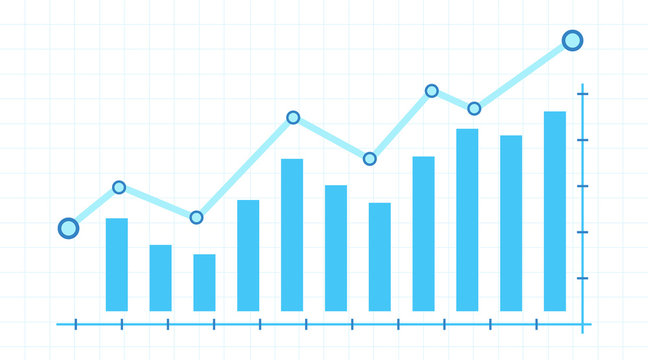

In [41]:
Image(filename='upward.jpg')

Likewise we can also have a falling or downward trend.

This below timeseries has some seasonality. This is when patterns repeat at predictable intervals and particular peaks and troughs. Like gift sales jumps up every holiday season, temperature drops every night etc

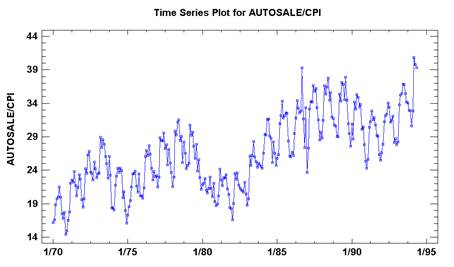

In [42]:
Image(filename='seasonality.jpg')

Some time series can have both Trend and Seasonality.

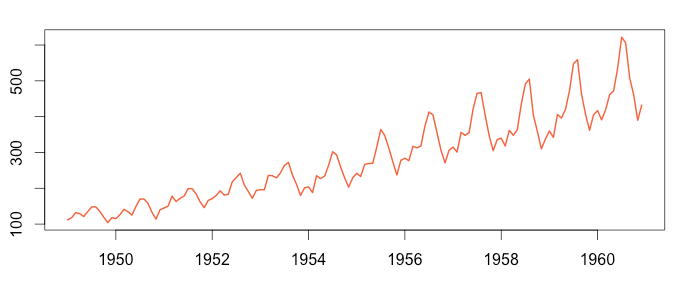

In [43]:
Image(filename='sea_trend.png')

And some are completely unpredictable!! This can be generated by predicting a random number at each step. This 
produces white noise. In such case u can find the distribution of it by getting the parameters. In this case its gaussian u can see it if u plot the histogram of it.

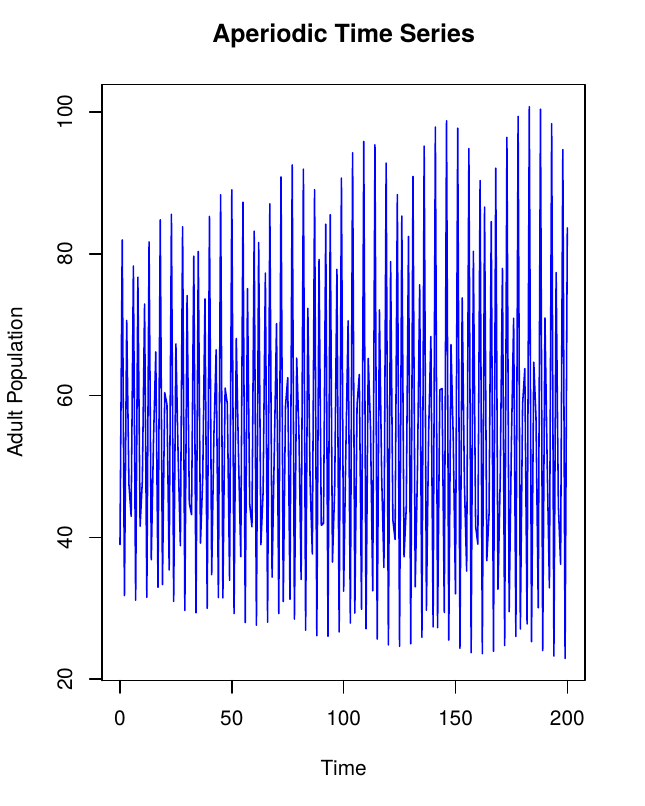

In [44]:
Image(filename='unpredictable.png')

In some timeseries we have no trend and no seasonality, the spikes appears at random timestamp, you cant predict when they happen next or how strong they would be but clearly the entire series isnt random, between the spikes there is a very deterministic type of decay like for the below case the series is v(t) = 0.99 * v(t-1) + occasional_spikes, such timeseries are calles Autocorrelated Timeseries, namely it correlates with the decayed copy of itself, often called as lag. In this example the red box say lag1, we have a strong autocorrelation, often a timeseries like this is described as having a memory, the steps are dependent on previous ones, the spikes which are unpredictable are often called innovations, in other words they cant be predicted based on past values.

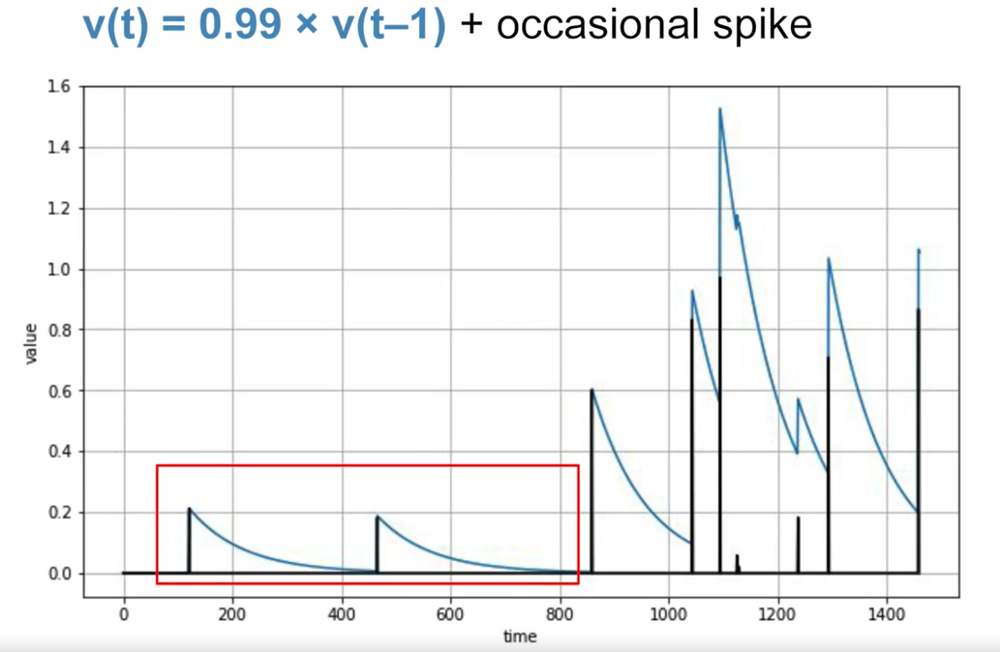

In [45]:
Image(filename='Autocorrelation.png')

Lets combine all together we get trend, seasonality, Autocorrelation and noise all together (Practical Situation)

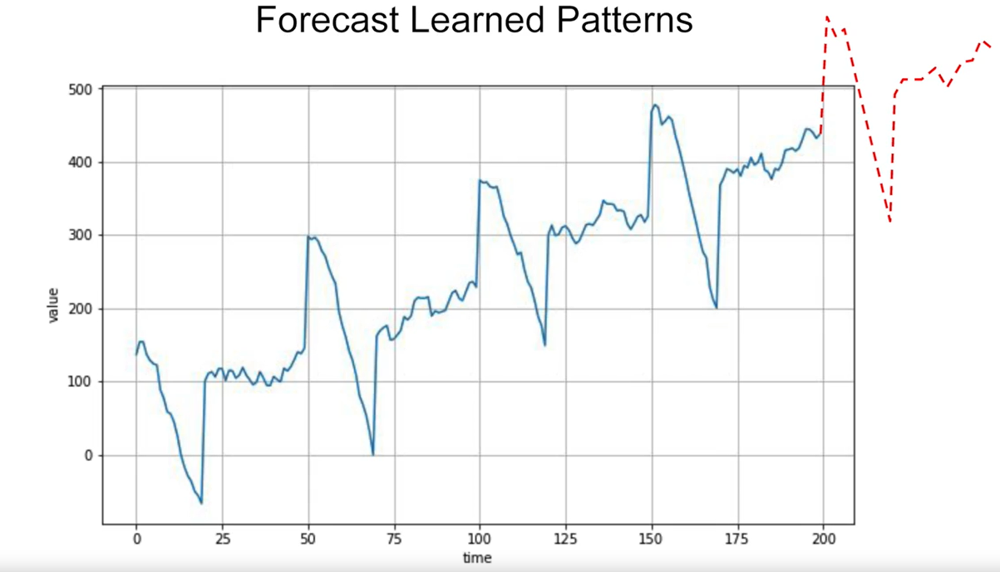

In [46]:
Image(filename='All_together.png')

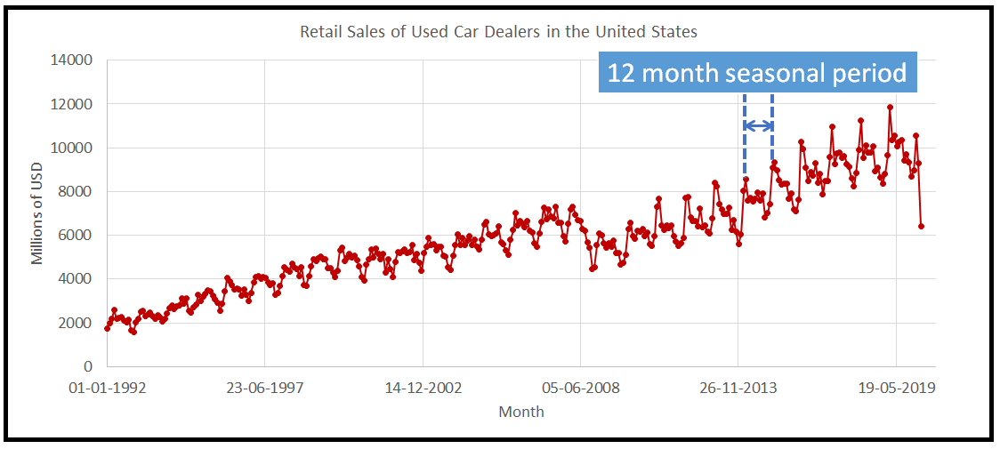

In [47]:
Image(filename='all.png')

Sometimes the behaviour of a trend or series might change i.e. they might not be stationary. Like below earlier we saw we had a positive trend, until we got a big event which could be say financial crisis or recession or something after which the series went down with no clear seasonality, such series are called Non stationary Time series.

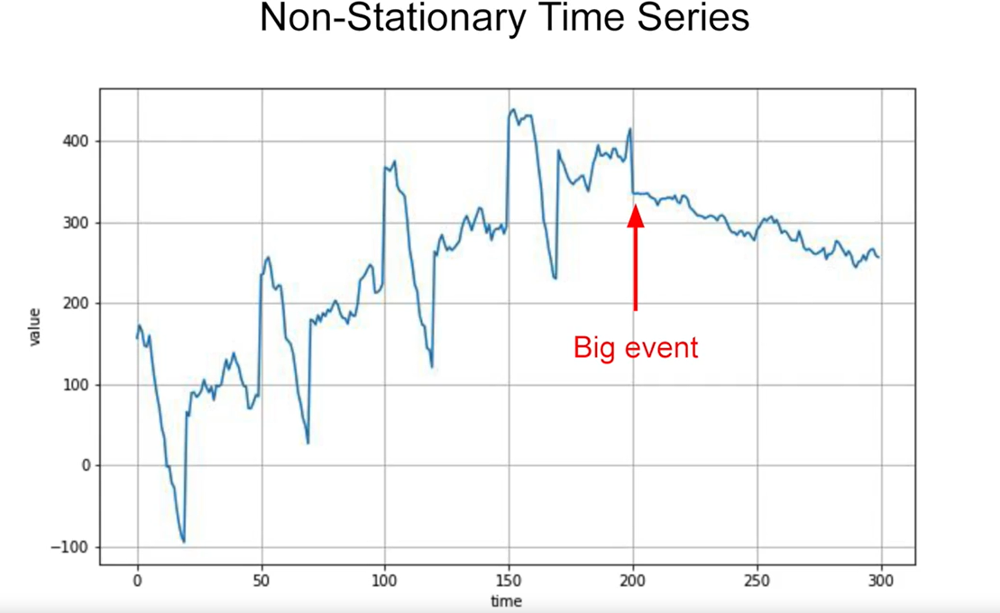

In [48]:
Image(filename='non_stationary.png')

In such cases, we could simply study the behaviour after the big event and only consider those data to make the prediction which 
sort of break the mould of more data gives more better ML algorithm. If your time series is stationary use the full data if not,
then after such event make sense. It really depends on the timeseries itself.

Lets try to forecast this time series.

In [49]:
# Lets see these patterns in code

def plot_series(time, series, format='-', start=0, end=None, label=None):
    # series is the value at each timestep.
    plt.plot(time[start:end], series[start:end], format, label=label)
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.grid()
    
    if label:
        plt.legend(fontsize=14)
        

In [50]:
def plot_series(time, series, format="-", start=0, end=None, label=None):
    plt.plot(time[start:end], series[start:end], format, label=label)
    plt.xlabel("time")
    plt.ylabel("value")
    plt.grid()
    if label:
        plt.legend(fontsize=12)

In [51]:
# Lets define a simple trend
def trend(time, slope=0):
    return slope * time

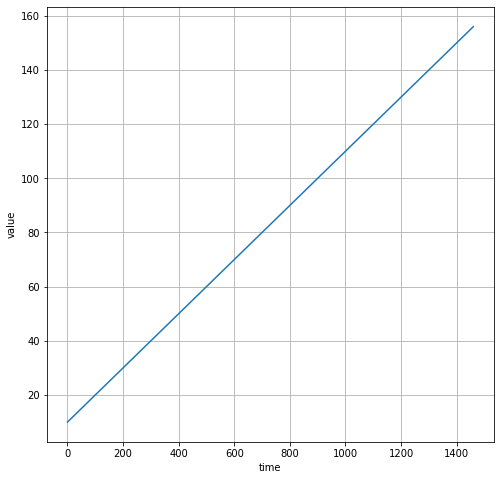

In [52]:
# Lets create an initial forward trend

baseline = 10  # intial value of our series.
time = np.arange(4 * 365 + 1)   # Simply taken randomly.
series = baseline + trend(time, 0.1)   # adding 0.1 at every time step

plt.figure(figsize=(8,8))
plot_series(time, series)
plt.show()

In [53]:
time

array([   0,    1,    2, ..., 1458, 1459, 1460])

In [54]:
series    # staring from baseline, then add 0.1 at every timestep.

array([ 10. ,  10.1,  10.2, ..., 155.8, 155.9, 156. ])

In [55]:
# Lets define some seasonal patters.

# this defines one season pattern
def seasonal_pattern(season_time):
    return np.where(season_time < 0.40, np.sin(season_time * 2 * np.pi), 
                   1 / np.exp(3 * season_time))

# Define multiples of it
def seasonality(time, period, amplitude=1, phase=0):
    # amplitude is the height and phase is the shift from zero, period is number of times to repeat
    season_time = ((time + phase) % period) / period
    return amplitude * seasonal_pattern(season_time)

In [56]:
def seasonal_pattern(seasonal_time):
    return np.where(seasonal_time < 0.40, np.cos(seasonal_time * 2 * np.pi),
                   1 / np.exp(3 * seasonal_time))

def seasonality(time, period, amplitude=1, phase=0):
    season_time = ((time + phase) % period) / period
    return amplitude * seasonal_pattern(season_time)

[0.         0.00273973 0.00547945 ... 0.99452055 0.99726027 0.        ]


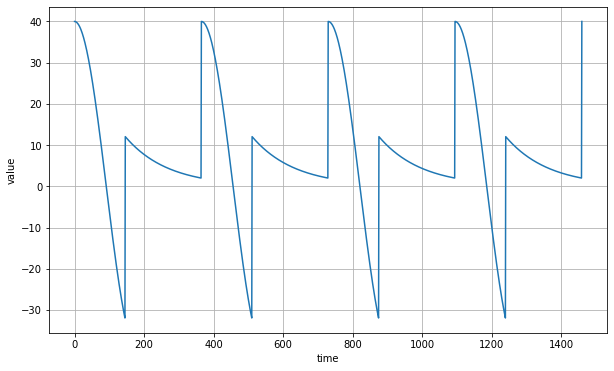

In [57]:
amplitude = 40
series = seasonality(time, period = 365, amplitude=amplitude)

plt.figure(figsize=(10, 6))
plot_series(time, series)
plt.show()
# If u see time was defined 4 * 365 + 1 hence we get only 4 of such curves

[0.         0.00273973 0.00547945 ... 0.99452055 0.99726027 0.        ]


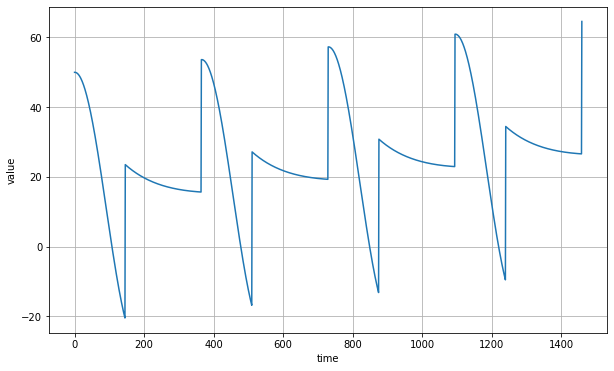

In [58]:
# Lets see seasonal trend.

slope = 0.01
series = baseline + trend(time, slope) + seasonality(time, period = 365, amplitude=amplitude)

plt.figure(figsize=(10, 6))
plot_series(time, series)
plt.show()

In practise there is always noise present. Here we plot white noise(meaning the noise are not correlated with each other) but in practise noise can be correlated to previous values

RandomState exposes a number of methods for generating random numbers drawn from a variety of probability distributions. In addition to the distribution-specific arguments, each method takes a keyword argument size that defaults to None. If size is None, then a single value is generated and returned. If size is an integer, then a 1-D array filled with generated values is returned. If size is a tuple, then an array with that shape is filled and returned.

In [59]:
def white_noise(time, noise_level=1, seed=None):
    rnd = np.random.RandomState(seed)
    return rnd.randn(len(time)) * noise_level

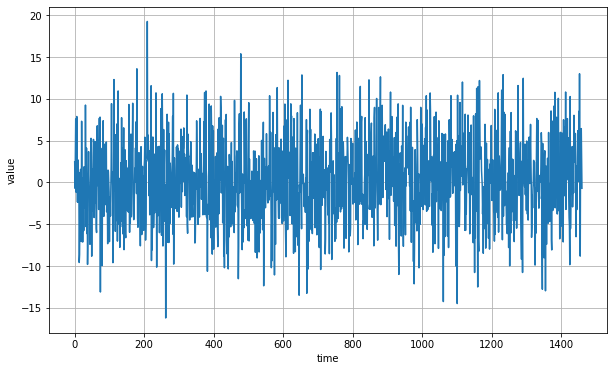

In [60]:
noise_level = 5
noise = white_noise(time, noise_level, seed=42)

plt.figure(figsize=(10, 6))
plot_series(time, noise)
plt.show()

Not much to do here. We can see the distribution here. If we want to forecast it the best value is 0

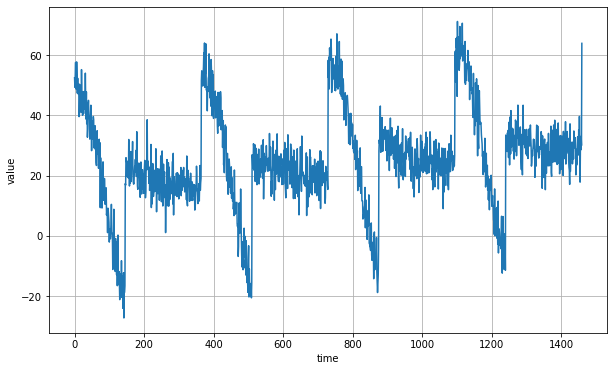

In [61]:
series += noise
plt.figure(figsize=(10, 6))
plot_series(time, series)
plt.show()

Its nice to dis-entangle everything i.e. from time series get the seasonality, trend and noise out to better 
study them

# Forecasting: 

The simplest way of forecasting is to often predict the last value as the next future value its called Naive 
Forecasting.

To see how does it work we need to first split the time series into a training period, validation period and test
period. Its called fixed partitioning. If the time series has seasonality, you generally want to ensure that each period 
contains a whole number of seasons. Like one year, two year, three year if the time series has year seasonality. Not like year and a half or some months will be more represented then the others.

Then we train the model in training period and evalutate on validation period to get best hyperparameter. then 
test it finally on test set.

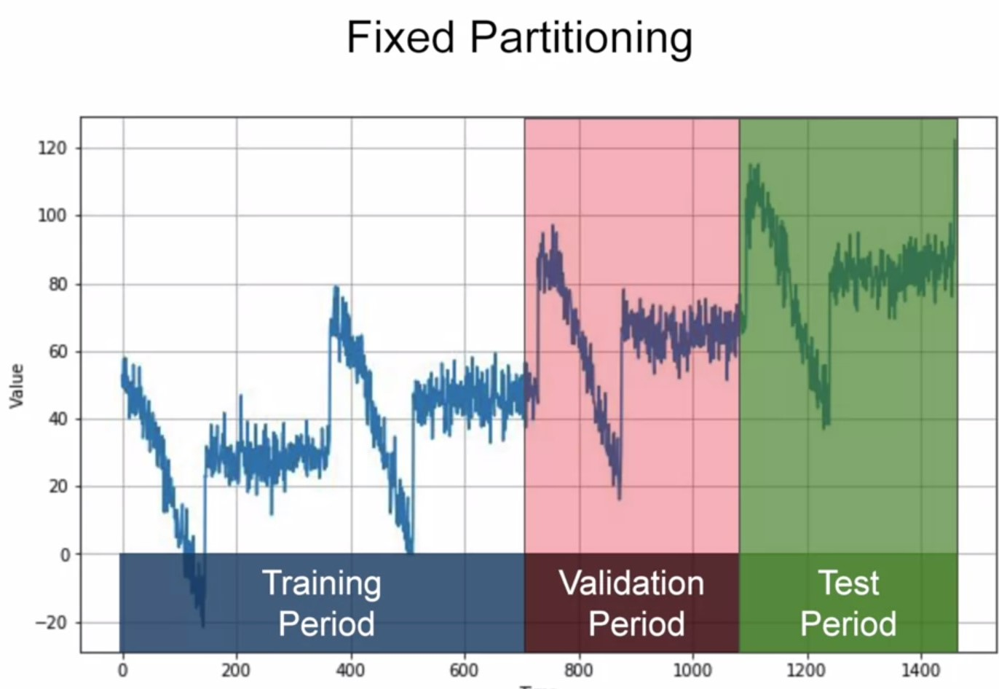

In [62]:
Image(filename="fixed_partition.jpg")

In the final u also want to train the whole model on whole set including test set, its not standard but useful in time series because thats the set which contains the closest and most of useful information to predict the future

Another way is called Roll Forward Partitioning shown below. We start with short training period and gradually 
increase it, say by one day at a time or one week at a time. At each iteration, we train the model on the training
period and we use it to forecast the following day or following week in the validation period. 

Drawback: Require much more training time.

Benefit: It will more closely mimic the production conditions since you will generally want to retain your model
regularity as you get a new data in production.

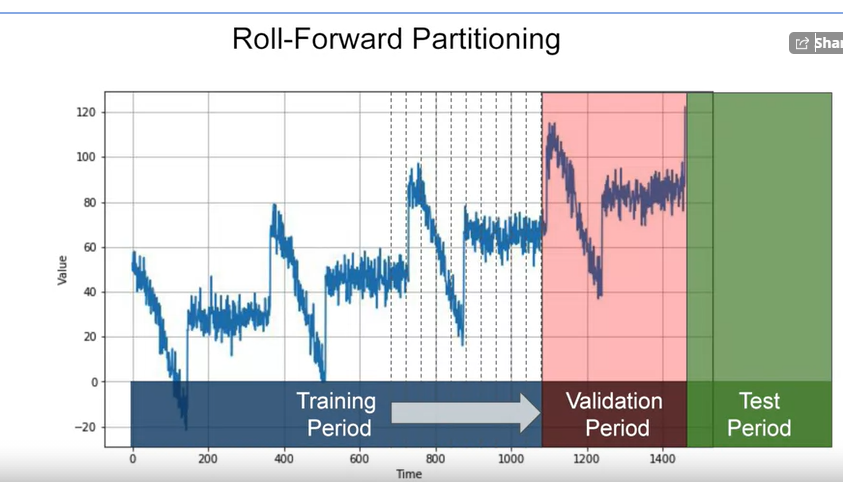

In [63]:
Image(filename="roll_forward.png")

In [64]:
# Lets split the dataset into training and validation period.

split_time = 1000
time_train = time[:split_time]
x_train = series[:split_time]

time_val = time[split_time:]
x_val = series[split_time:]

In [65]:
# Now since we do naive forecasting for the validation period, we will simply predict the last value.
# Since validation period starts from 1000 we start predicting from one step before.

naive_forecast = series[split_time-1:-1]   # And for the last day we predict the previous to the last value.

In [66]:
naive_forecast

array([ 2.72367342e+01,  3.13447137e+01,  2.89455149e+01,  2.45951997e+01,
        2.10373542e+01,  2.77384315e+01,  2.61903029e+01,  2.86746850e+01,
        2.73507005e+01,  2.93990049e+01,  2.14517402e+01,  3.06918342e+01,
        2.50700801e+01,  3.44358730e+01,  2.05913822e+01,  3.26951570e+01,
        2.49831703e+01,  2.07150645e+01,  2.15315210e+01,  2.23282647e+01,
        2.60301353e+01,  2.65030387e+01,  2.10001661e+01,  2.37269452e+01,
        3.45403671e+01,  3.24472714e+01,  2.59719553e+01,  2.39613750e+01,
        2.43527720e+01,  2.68016983e+01,  1.86018721e+01,  2.24109101e+01,
        1.53370598e+01,  2.56585108e+01,  2.68810157e+01,  2.12119685e+01,
        3.14809216e+01,  1.74654666e+01,  1.62559463e+01,  2.46838222e+01,
        2.87810119e+01,  3.19493294e+01,  2.12196515e+01,  2.88920686e+01,
        2.32909217e+01,  2.26053335e+01,  2.78719802e+01,  2.67007083e+01,
        1.55427477e+01,  3.07932245e+01,  3.02969918e+01,  2.02549301e+01,
        2.53481646e+01,  

Here the change is not noticable

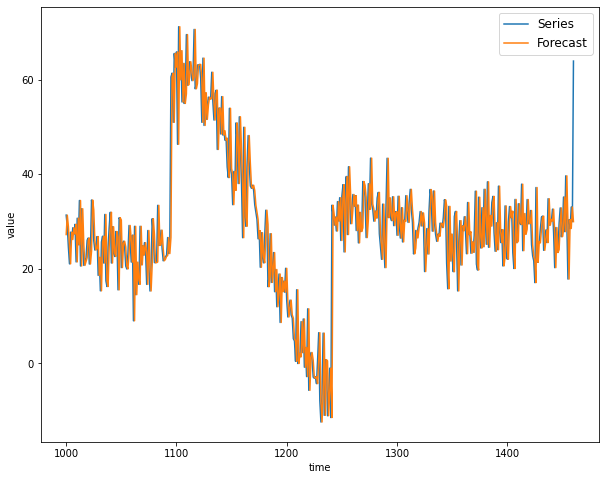

In [67]:
plt.figure(figsize=(10,8))
plot_series(time_val, x_val, label='Series')
plot_series(time_val, naive_forecast, label='Forecast')

If we see more closely 

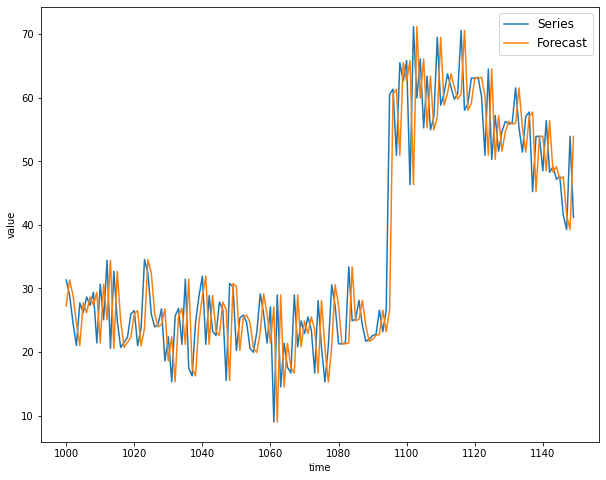

In [68]:
plt.figure(figsize=(10,8))
plot_series(time_val, x_val, label='Series', start=0, end=150)
plot_series(time_val, naive_forecast, label='Forecast',start=0, end=150)

How good it is? For that we could use metrics. Here we use mean squared error between the forecast and the predicton in validation period

In [69]:
errors = naive_forecast - x_val
abs_error = np.abs(errors)
mae = abs_error.mean()
mae

5.9389127149029

# Metrics

In [70]:
tf.keras.metrics.mean_absolute_error(x_val, naive_forecast)   # This is our baseline

<tf.Tensor: shape=(), dtype=float64, numpy=5.9389127149029>

Another simple forecasting method is to compute moving average which is the mean of the past N values, for example
mean value over the last 30 days. This nicely eliminates a lot of noise but it does not anticipate trend or seasonality.
So it ends up performing worst then naive forecasting in this case.

In [71]:
def moving_average_forecast(series, window_size):   # Slow
    
    # window_size is the time window to compute the mean over.
    '''Forecast the mean of the last few values.
    If window_size = 1, then this is equivalent to naive forecast.'''
    
    forecast = []
    for time in range(len(series) - window_size): # Iterate through all the timestep except for the windows
        forecast.append(series[time:time+window_size].mean())
    return np.asarray(forecast)

In [72]:
# Faster version of the above function can be written as

def moving_average_forecast(series, windows_size):
    mov = np.cumsum(series)
    mov[windows_size:] = mov[windows_size:] - mov[:-windows_size]
    return mov[windows_size - 1:-1] / windows_size

In [73]:
WS = 30
moving_average = moving_average_forecast(series, WS)[split_time - WS:]
# Because for the first value of the validation period its forecast will be mean of the past 30 days so we start
# from [split_time - 30: ]

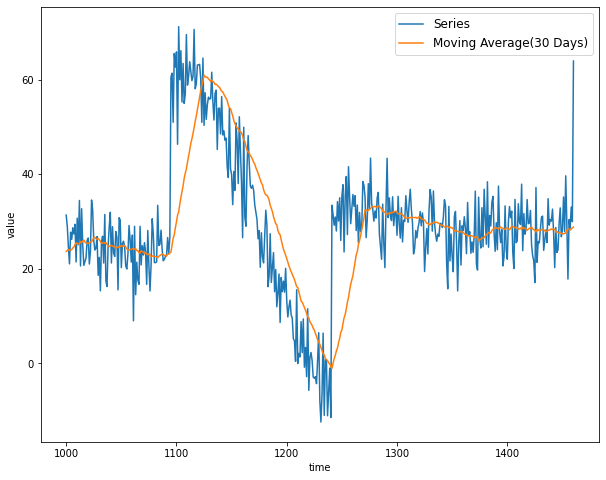

In [74]:
plt.figure(figsize=(10,8))
plot_series(time_val, x_val, label='Series')
plot_series(time_val, moving_average, label='Moving Average(30 Days)')

One way to fix this up, is to remove the trend and seasonality from the time series. For this, a simple technique
is to use Differencing. Like in above the time series is in years, so instead of studying time series itself, we 
study the difference between the value at time t and the value one year earlier(i.e. t and t-365), if u see below
it has no trend and no seasonality looks like white noise,we can then use this time series which gives us these forecasts, but these are for the differenced time series not the original time series.

Small code to understand

In [87]:
diff_series

array([-0.83967312,  5.46178391,  0.47451931, ...,  9.83903434,
        3.35270637,  3.36130298])

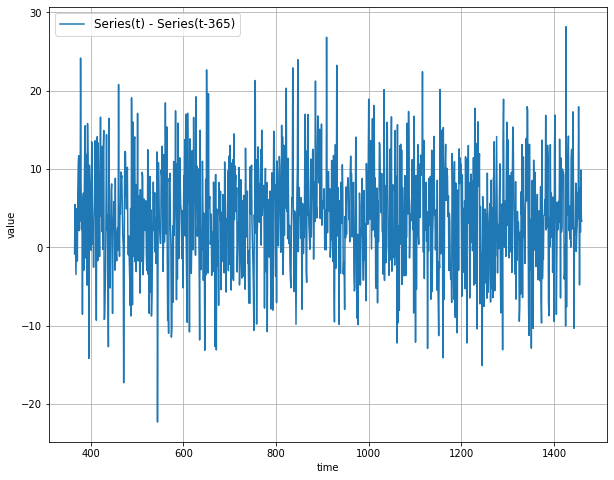

In [75]:
diff_series = (series[365:] - series[:-365])
diff_time = time[365:]  # The value at index 365 will be series[365]-series[365-365]
# As series will now be at yearly pattern and at t = 365, the value will be differenced. see above example

plt.figure(figsize=(10, 8))
plot_series(diff_time, diff_series, label='Series(t) - Series(t-365)')
plt.show()

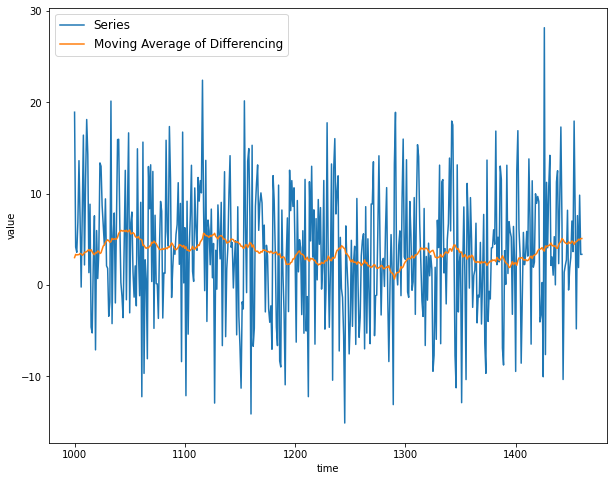

In [76]:
diff_moving_average = moving_average_forecast(diff_series, 50)[split_time - 365 - 50:]

plt.figure(figsize=(10,8))
plot_series(time_val, diff_series[split_time - 365:], label='Series')
plot_series(time_val, diff_moving_average, label='Moving Average of Differencing')

To get the final forecast for the original time series
we need to add back the value at time t-365. Below shows then the new nice forecast.

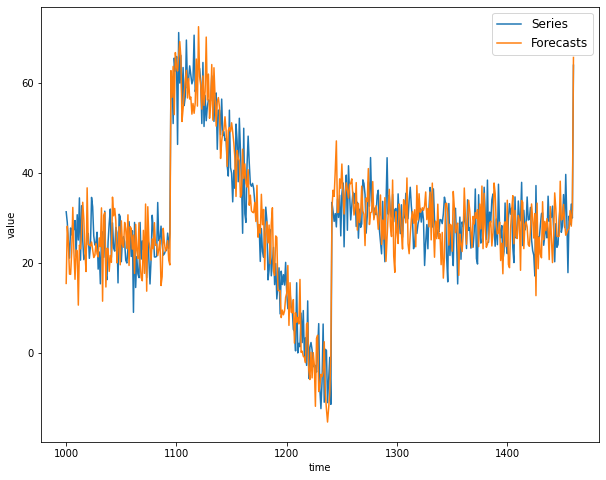

In [77]:
diff_moving_Avg_plus_past = series[split_time - 365: -365] + diff_moving_average


plt.figure(figsize=(10,8))
plot_series(time_val, x_val, label='Series')
plot_series(time_val, diff_moving_Avg_plus_past, label='Forecasts')

In [78]:
tf.keras.metrics.mean_absolute_error(x_val, diff_moving_Avg_plus_past)

<tf.Tensor: shape=(), dtype=float64, numpy=5.8393105629958955>

Slightly Better then naive forecasting. We can see that forecast are close to actual series but due to noise there
is still lot of difference between them

Our moving average removed lot of noise but here we can see that even though the plot looks convincing we still have lot of noise involved. This noise actually came from the past values that we added back to the forecast. we can improve it by removing the past noise by doing a moving average on that.

Note: We used a trailing window while computing the moving average of present values but we used a centered window to compute the moving average of past values. Moving averages using centered windows can be more accurate than using trailing windows. But we can't use centered windows to smooth present values since we don't know future values. However, to smooth past values we can afford to use centered windows.

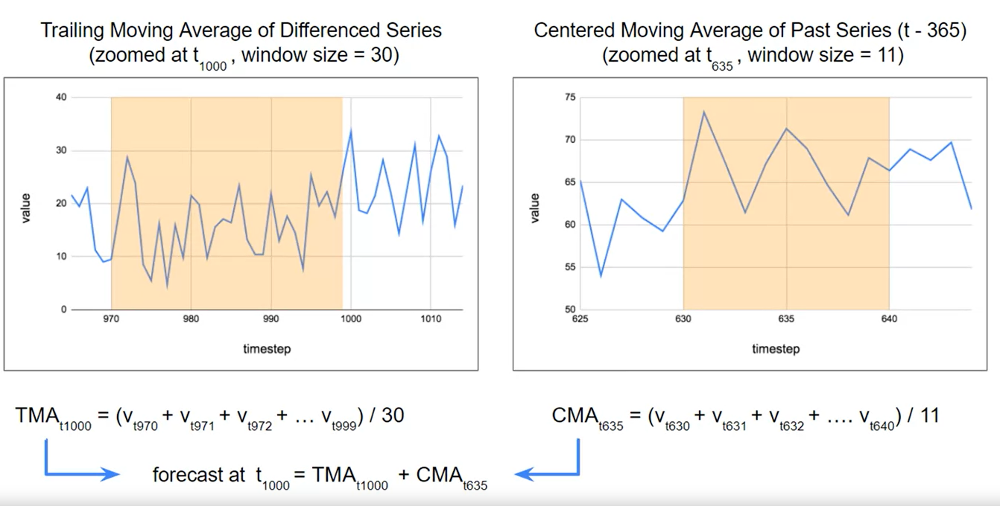

In [79]:
Image(filename='trailing_centered_window.png')

# Smoothing:

In [84]:
# Smooth the original series before adding the time differenced moving average
diff_moving_avg_plus_smooth_past = moving_average_forecast(series[split_time - 370:-359], 11) + diff_moving_average

# Plot the results
# plot_series(time_val, (x_val, diff_moving_avg_plus_smooth_past))

In [86]:
tf.keras.metrics.mean_absolute_error(x_val, diff_moving_avg_plus_smooth_past)    # Much better

<tf.Tensor: shape=(), dtype=float64, numpy=4.566859958970767>

Now lets try to build a model that will learn to forecast the next time step, given a time window before it.
Its simply creating a dataset with shift of window.

We first need to choose a window_size say of 30 days and we must prepare a dataset of all possilbe time window of
that size.

In [38]:
# Lets see how to do it in tensorflow
dataset = tf.data.Dataset.range(10)
for instance in dataset:
    print(instance)

tf.Tensor(0, shape=(), dtype=int64)
tf.Tensor(1, shape=(), dtype=int64)
tf.Tensor(2, shape=(), dtype=int64)
tf.Tensor(3, shape=(), dtype=int64)
tf.Tensor(4, shape=(), dtype=int64)
tf.Tensor(5, shape=(), dtype=int64)
tf.Tensor(6, shape=(), dtype=int64)
tf.Tensor(7, shape=(), dtype=int64)
tf.Tensor(8, shape=(), dtype=int64)
tf.Tensor(9, shape=(), dtype=int64)


Lets transform this dataset to get all possible windows of 5 consecutive timestep.

In [39]:
dataset = tf.data.Dataset.range(10)
dataset = dataset.window(5, shift=1)  
# windowsize = 5 and shift of 1 this gives us all windows as a tensorflow dataset.

for windows in dataset:
    for instance in windows:
        print(instance.numpy(), end=' ')
    print()

0 1 2 3 4 
1 2 3 4 5 
2 3 4 5 6 
3 4 5 6 7 
4 5 6 7 8 
5 6 7 8 9 
6 7 8 9 
7 8 9 
8 9 
9 


NOte that last windows are shorter then 5 time steps, in Models we usually want them to have same window size 
so we drop the remainders as

In [40]:
dataset = tf.data.Dataset.range(10)
dataset = dataset.window(5, drop_remainder=True, shift = 1)
for windows in dataset:
    for instance in windows:
        print(instance.numpy(), end=' ')
    print()

0 1 2 3 4 
1 2 3 4 5 
2 3 4 5 6 
3 4 5 6 7 
4 5 6 7 8 
5 6 7 8 9 


In [41]:
dataset = tf.data.Dataset.range(10)
dataset = dataset.window(5, shift=1, drop_remainder=True)
dataset = dataset.flat_map(lambda window : window.batch(5))

for window in dataset:
    print(window.numpy())

[0 1 2 3 4]
[1 2 3 4 5]
[2 3 4 5 6]
[3 4 5 6 7]
[4 5 6 7 8]
[5 6 7 8 9]


We now need targets, so we can use the first four elements of the batch as input and the last one as the output.

In [42]:
dataset = tf.data.Dataset.range(10)
dataset = dataset.window(5, shift=1, drop_remainder=True)
dataset = dataset.flat_map(lambda window : window.batch(5))
dataset = dataset.map(lambda window: (window[:-1], window[-1:]))
for x, y in dataset:
    print(x.numpy(), y.numpy())

[0 1 2 3] [4]
[1 2 3 4] [5]
[2 3 4 5] [6]
[3 4 5 6] [7]
[4 5 6 7] [8]
[5 6 7 8] [9]


In [43]:
dataset = tf.data.Dataset.range(10)
dataset = dataset.window(5, shift=1, drop_remainder=True)
dataset = dataset.flat_map(lambda window : window.batch(5))
dataset = dataset.map(lambda window: (window[:-1], window[-1:]))
dataset = dataset.shuffle(buffer_size=10)
for x, y in dataset:
    print(x.numpy(), y.numpy())

[2 3 4 5] [6]
[5 6 7 8] [9]
[0 1 2 3] [4]
[3 4 5 6] [7]
[1 2 3 4] [5]
[4 5 6 7] [8]


Now lets batch, cache and prefetch for batching and performance purpose

In [44]:
dataset = tf.data.Dataset.range(10)
dataset = dataset.window(5, shift=1, drop_remainder=True)
dataset = dataset.flat_map(lambda window : window.batch(5))
dataset = dataset.map(lambda window: (window[:-1], window[-1:]))
dataset = dataset.shuffle(buffer_size=10)
dataset = dataset.cache().batch(2).prefetch(1)
for x, y in dataset:
    print(x.numpy(), y.numpy())

[[3 4 5 6]
 [1 2 3 4]] [[7]
 [5]]
[[5 6 7 8]
 [4 5 6 7]] [[9]
 [8]]
[[2 3 4 5]
 [0 1 2 3]] [[6]
 [4]]


Alle Zusammen

In [46]:
# Function that converts a time series to dataset for training a machine learning model


def window_dataset(series, window_size, batch_size=32):
    dataset = tf.data.Dataset.from_tensor_slices(series)
    dataset = dataset.window(window_size+1, shift=1, drop_remainder=True)
    # +1 because one last element will become target
    dataset = dataset.flat_map(lambda window: window.batch(window_size+1))
    dataset = dataset.map(lambda window: (window[:-1], window[-1:]), num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.shuffle(buffer_size=len(series)).cache().batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

In [47]:
dataset = window_dataset(series=series, window_size=10)

In [48]:
for X, Y in dataset:
    print(X,end='\n')
    print(Y)
    break

tf.Tensor(
[[ 2.82711943e+01  2.05943487e+01  2.24543250e+01  3.32971056e+01
   2.39934294e+01  2.20264328e+01  2.99275587e+01  3.31563414e+01
   3.08063296e+01  3.21757588e+01]
 [ 8.54765816e+00  8.74170452e+00  1.21779018e+01  1.46941414e+01
   1.73073226e+01  2.31211257e+01  2.00243535e+01  1.49282232e+01
   1.56248438e+01  1.06994343e+01]
 [ 5.80714469e+01  5.21250231e+01  4.53418365e+01  5.08750947e+01
   5.21258264e+01  4.99133508e+01  3.84858118e+01  4.22254131e+01
   4.41393424e+01  4.45124244e+01]
 [-3.24397586e+00 -5.54470316e+00 -1.18290677e+01 -8.81013052e-01
  -3.43964441e+00 -3.84288315e+00 -1.29380839e+01 -1.96447063e+00
  -1.65690078e+01 -7.20061686e+00]
 [ 2.59033914e+01  2.15757072e+01  1.89889521e+01  2.02834313e+01
   9.22474127e+00  1.73997038e+01  1.96168225e+01  2.45518456e+01
   1.39002607e+01  1.17767025e+01]
 [ 3.06683037e+01  4.05429476e+01  3.88489700e+01  3.85782039e+01
   3.02406258e+01  3.06176055e+01  4.06818135e+01  3.46062591e+01
   3.75945326e+01  3.3

In [49]:
# Lets train a simple Dense regression model
tf.keras.backend.clear_session()  # Make sure when multiple time the cell is executed it starts from zero
tf.random.set_seed(42)  
np.random.seed(42)
# seed will ensure we get the same result everytime we execute it.

window = 30
train = window_dataset(x_train, window_size=window)
val = window_dataset(x_val, window_size=window)

model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(1, input_shape=[window])
])

In [50]:
optimizer = tf.keras.optimizers.SGD(learning_rate = 1e-5, momentum=0.9)

# When u want to optimize the MAE, huber loss is a nice choice. Its linear for large loss and quadratic for small
# ones. WE could use mean absolute error directly as our loss function but the huber loss converges much better.
model.compile(loss=tf.keras.losses.Huber(), optimizer = optimizer, metrics = ['mae'])
earlystop = tf.keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True)
# Keras will check the validation loss at the end of each epoch and stops if doesnt imporve for 10 epochs.

model.fit(train, validation_data=val, epochs = 500, callbacks=[earlystop])

Epoch 1/500
31/31 [==============================] - 12s 62ms/step - loss: 35.0076 - mae: 35.5048 - val_loss: 18.4908 - val_mae: 18.9871
Epoch 2/500
31/31 [==============================] - 0s 8ms/step - loss: 11.1752 - mae: 11.6636 - val_loss: 9.1847 - val_mae: 9.6735
Epoch 3/500
31/31 [==============================] - 0s 8ms/step - loss: 9.9159 - mae: 10.4044 - val_loss: 9.1302 - val_mae: 9.6202
Epoch 4/500
31/31 [==============================] - 0s 8ms/step - loss: 9.7674 - mae: 10.2552 - val_loss: 9.0813 - val_mae: 9.5718
Epoch 5/500
31/31 [==============================] - 0s 8ms/step - loss: 9.6666 - mae: 10.1532 - val_loss: 8.9631 - val_mae: 9.4554
Epoch 6/500
31/31 [==============================] - 0s 10ms/step - loss: 9.5548 - mae: 10.0403 - val_loss: 8.8755 - val_mae: 9.3684
Epoch 7/500
31/31 [==============================] - 0s 8ms/step - loss: 9.4512 - mae: 9.9360 - val_loss: 8.7838 - val_mae: 9.2765
Epoch 8/500
31/31 [==============================] - 0s 8ms/step - los

Epoch 63/500
31/31 [==============================] - 0s 10ms/step - loss: 5.7768 - mae: 6.2611 - val_loss: 5.8457 - val_mae: 6.3248
Epoch 64/500
31/31 [==============================] - 0s 8ms/step - loss: 5.7473 - mae: 6.2320 - val_loss: 5.8245 - val_mae: 6.3045
Epoch 65/500
31/31 [==============================] - 0s 8ms/step - loss: 5.7184 - mae: 6.2031 - val_loss: 5.8039 - val_mae: 6.2845
Epoch 66/500
31/31 [==============================] - 0s 8ms/step - loss: 5.6899 - mae: 6.1748 - val_loss: 5.7840 - val_mae: 6.2656
Epoch 67/500
31/31 [==============================] - 0s 8ms/step - loss: 5.6620 - mae: 6.1473 - val_loss: 5.7648 - val_mae: 6.2473
Epoch 68/500
31/31 [==============================] - 0s 10ms/step - loss: 5.6350 - mae: 6.1205 - val_loss: 5.7457 - val_mae: 6.2291
Epoch 69/500
31/31 [==============================] - 0s 13ms/step - loss: 5.6085 - mae: 6.0940 - val_loss: 5.7270 - val_mae: 6.2110
Epoch 70/500
31/31 [==============================] - 0s 8ms/step - loss:

31/31 [==============================] - 0s 8ms/step - loss: 4.3927 - mae: 4.8667 - val_loss: 4.6109 - val_mae: 5.0907
Epoch 186/500
31/31 [==============================] - 0s 8ms/step - loss: 4.3907 - mae: 4.8647 - val_loss: 4.6080 - val_mae: 5.0876
Epoch 187/500
31/31 [==============================] - 0s 10ms/step - loss: 4.3887 - mae: 4.8628 - val_loss: 4.6051 - val_mae: 5.0846
Epoch 188/500
31/31 [==============================] - 0s 9ms/step - loss: 4.3868 - mae: 4.8609 - val_loss: 4.6022 - val_mae: 5.0817
Epoch 189/500
31/31 [==============================] - 0s 7ms/step - loss: 4.3848 - mae: 4.8590 - val_loss: 4.5994 - val_mae: 5.0789
Epoch 190/500
31/31 [==============================] - 0s 8ms/step - loss: 4.3830 - mae: 4.8572 - val_loss: 4.5967 - val_mae: 5.0761
Epoch 191/500
31/31 [==============================] - 0s 8ms/step - loss: 4.3811 - mae: 4.8554 - val_loss: 4.5940 - val_mae: 5.0733
Epoch 192/500
31/31 [==============================] - 0s 8ms/step - loss: 4.3793 

Epoch 247/500
31/31 [==============================] - 0s 8ms/step - loss: 4.3142 - mae: 4.7879 - val_loss: 4.4996 - val_mae: 4.9710
Epoch 248/500
31/31 [==============================] - 0s 8ms/step - loss: 4.3135 - mae: 4.7872 - val_loss: 4.4986 - val_mae: 4.9700
Epoch 249/500
31/31 [==============================] - 0s 8ms/step - loss: 4.3129 - mae: 4.7865 - val_loss: 4.4976 - val_mae: 4.9691
Epoch 250/500
31/31 [==============================] - 0s 8ms/step - loss: 4.3122 - mae: 4.7858 - val_loss: 4.4966 - val_mae: 4.9682
Epoch 251/500
31/31 [==============================] - 0s 10ms/step - loss: 4.3116 - mae: 4.7852 - val_loss: 4.4957 - val_mae: 4.9673
Epoch 252/500
31/31 [==============================] - 0s 8ms/step - loss: 4.3109 - mae: 4.7845 - val_loss: 4.4947 - val_mae: 4.9664
Epoch 253/500
31/31 [==============================] - 0s 8ms/step - loss: 4.3103 - mae: 4.7839 - val_loss: 4.4938 - val_mae: 4.9656
Epoch 254/500
31/31 [==============================] - 0s 9ms/step -

Epoch 370/500
31/31 [==============================] - 0s 8ms/step - loss: 4.2817 - mae: 4.7549 - val_loss: 4.4465 - val_mae: 4.9200
Epoch 371/500
31/31 [==============================] - 0s 8ms/step - loss: 4.2816 - mae: 4.7549 - val_loss: 4.4464 - val_mae: 4.9198
Epoch 372/500
31/31 [==============================] - 0s 8ms/step - loss: 4.2816 - mae: 4.7548 - val_loss: 4.4462 - val_mae: 4.9196
Epoch 373/500
31/31 [==============================] - 0s 8ms/step - loss: 4.2815 - mae: 4.7548 - val_loss: 4.4461 - val_mae: 4.9194
Epoch 374/500
31/31 [==============================] - 0s 9ms/step - loss: 4.2815 - mae: 4.7548 - val_loss: 4.4459 - val_mae: 4.9193
Epoch 375/500
31/31 [==============================] - 0s 8ms/step - loss: 4.2814 - mae: 4.7547 - val_loss: 4.4458 - val_mae: 4.9191
Epoch 376/500
31/31 [==============================] - 0s 8ms/step - loss: 4.2814 - mae: 4.7547 - val_loss: 4.4456 - val_mae: 4.9189
Epoch 377/500
31/31 [==============================] - 0s 8ms/step - 

Epoch 493/500
31/31 [==============================] - 0s 8ms/step - loss: 4.2793 - mae: 4.7532 - val_loss: 4.4355 - val_mae: 4.9078
Epoch 494/500
31/31 [==============================] - 0s 8ms/step - loss: 4.2793 - mae: 4.7532 - val_loss: 4.4354 - val_mae: 4.9078
Epoch 495/500
31/31 [==============================] - 0s 8ms/step - loss: 4.2793 - mae: 4.7532 - val_loss: 4.4354 - val_mae: 4.9077
Epoch 496/500
31/31 [==============================] - 0s 8ms/step - loss: 4.2793 - mae: 4.7532 - val_loss: 4.4353 - val_mae: 4.9077
Epoch 497/500
31/31 [==============================] - 0s 8ms/step - loss: 4.2793 - mae: 4.7532 - val_loss: 4.4353 - val_mae: 4.9076
Epoch 498/500
31/31 [==============================] - 0s 8ms/step - loss: 4.2793 - mae: 4.7532 - val_loss: 4.4353 - val_mae: 4.9076
Epoch 499/500
31/31 [==============================] - 0s 8ms/step - loss: 4.2792 - mae: 4.7532 - val_loss: 4.4352 - val_mae: 4.9075
Epoch 500/500
31/31 [==============================] - 0s 8ms/step - 

In [51]:
# Lets define a forecast method to predict 

def model_forecast(model, series, window_size):
    dataset = tf.data.Dataset.from_tensor_slices(series)
    dataset = dataset.window(window_size, shift=1, drop_remainder=True)
    # +1 because one last element will become target
    dataset = dataset.flat_map(lambda window: window.batch(window_size))
    # SInce we have to just predict so we dont shuffleit 
    dataset = dataset.batch(32).prefetch(tf.data.AUTOTUNE)
    return model.predict(dataset)

Scheduler: Idea is to start with a small learning rate and gradually increase it as the epoch goes or the other 
    way around

In [52]:
# LEts try to find good learning rate

learn_schedule = tf.keras.callbacks.LearningRateScheduler(lambda epoch: 1e-6 * 10**(epoch/30))
# We start with a very small learning rate 1e-6 and then every 30 epochs we increase it by 10

In [53]:
optimizer = tf.keras.optimizers.SGD(lr = 1e-6, momentum=0.9)

model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(1, input_shape=[window])
])

model.compile(loss=tf.keras.losses.Huber(), optimizer=optimizer, metrics=['mae'])

history = model.fit(train, validation_data=val, epochs = 500, callbacks=[learn_schedule, earlystop])

C:\Users\Gopu_dfki\Anaconda3\envs\tf2_deepai\lib\site-packages\keras\optimizers\optimizer_v2\gradient_descent.py:108: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(SGD, self).__init__(name, **kwargs)


Epoch 1/500
31/31 [==============================] - 1s 12ms/step - loss: 6.8883 - mae: 7.3714 - val_loss: 6.8433 - val_mae: 7.3263 - lr: 1.0000e-06
Epoch 2/500
31/31 [==============================] - 0s 9ms/step - loss: 6.8696 - mae: 7.3526 - val_loss: 6.8259 - val_mae: 7.3089 - lr: 1.0798e-06
Epoch 3/500
31/31 [==============================] - 0s 9ms/step - loss: 6.8485 - mae: 7.3317 - val_loss: 6.8067 - val_mae: 7.2896 - lr: 1.1659e-06
Epoch 4/500
31/31 [==============================] - 0s 9ms/step - loss: 6.8267 - mae: 7.3100 - val_loss: 6.7860 - val_mae: 7.2685 - lr: 1.2589e-06
Epoch 5/500
31/31 [==============================] - 0s 8ms/step - loss: 6.8039 - mae: 7.2877 - val_loss: 6.7640 - val_mae: 7.2464 - lr: 1.3594e-06
Epoch 6/500
31/31 [==============================] - 0s 8ms/step - loss: 6.7803 - mae: 7.2645 - val_loss: 6.7410 - val_mae: 7.2233 - lr: 1.4678e-06
Epoch 7/500
31/31 [==============================] - 0s 9ms/step - loss: 6.7557 - mae: 7.2400 - val_loss: 6.716

Epoch 56/500
31/31 [==============================] - 0s 9ms/step - loss: 4.8402 - mae: 5.3190 - val_loss: 5.0560 - val_mae: 5.5341 - lr: 6.8129e-05
Epoch 57/500
31/31 [==============================] - 0s 8ms/step - loss: 4.8090 - mae: 5.2836 - val_loss: 4.8335 - val_mae: 5.3066 - lr: 7.3564e-05
Epoch 58/500
31/31 [==============================] - 0s 8ms/step - loss: 4.6837 - mae: 5.1560 - val_loss: 4.7694 - val_mae: 5.2415 - lr: 7.9433e-05
Epoch 59/500
31/31 [==============================] - 0s 8ms/step - loss: 4.6264 - mae: 5.1018 - val_loss: 4.7269 - val_mae: 5.1978 - lr: 8.5770e-05
Epoch 60/500
31/31 [==============================] - 0s 8ms/step - loss: 4.5802 - mae: 5.0564 - val_loss: 4.6829 - val_mae: 5.1577 - lr: 9.2612e-05
Epoch 61/500
31/31 [==============================] - 0s 8ms/step - loss: 4.5429 - mae: 5.0192 - val_loss: 4.6312 - val_mae: 5.1084 - lr: 1.0000e-04
Epoch 62/500
31/31 [==============================] - 0s 8ms/step - loss: 4.5121 - mae: 4.9869 - val_loss:

(1e-07, 0.005, 0.0, 30.0)

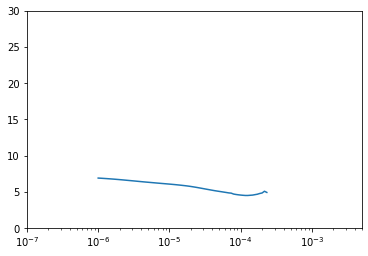

In [54]:
plt.semilogx(history.history['lr'], history.history['loss'])
plt.axis([1e-7, 5e-3, 0, 30])

In [55]:
lin_forecast = model_forecast(model, series[split_time - window:-1], window_size=window)
# We need to pass the time series starting from 30 time step before the start of validation period so that our
# forecast will start at the first time step of the validation period. So there is an overlap which is ignored for
# now
lin_forecast = lin_forecast[:,0]

# Prediction are two dimensional, the first dimension is the batch dimension. In this each instance in the batch
# is small window of 30 timestep and the output is the corresponding forecasts for the next time step. and the second
# dimension is the dimensionality of forecast. So second dimension is 1.

15/15 [==============================] - 0s 7ms/step


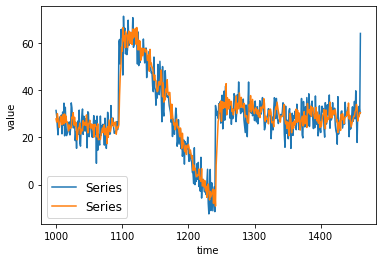

In [56]:
plot_series(time_val, x_val, label='Series')
plot_series(time_val, lin_forecast, label='Series')

In [58]:
tf.keras.metrics.mean_absolute_error(x_val, lin_forecast)
# Pretty well

<tf.Tensor: shape=(), dtype=float32, numpy=5.013913>

In [59]:
# Lets train a two layer Dense Mdel

model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(10, input_shape=[window], activation='relu'),
    tf.keras.layers.Dense(10, activation='relu'),
    tf.keras.layers.Dense(1)
])

In [60]:
model.compile(loss=tf.keras.losses.Huber(), optimizer=optimizer, metrics=['mae'])

model.fit(train, validation_data=val, epochs = 500, callbacks=[learn_schedule, earlystop])

Epoch 1/500
31/31 [==============================] - 1s 18ms/step - loss: 40.0606 - mae: 40.5602 - val_loss: 47.6186 - val_mae: 48.1186 - lr: 1.0000e-06
Epoch 2/500
31/31 [==============================] - 0s 10ms/step - loss: 36.1293 - mae: 36.6288 - val_loss: 42.2401 - val_mae: 42.7393 - lr: 1.0798e-06
Epoch 3/500
31/31 [==============================] - 0s 10ms/step - loss: 32.1871 - mae: 32.6866 - val_loss: 37.6070 - val_mae: 38.1070 - lr: 1.1659e-06
Epoch 4/500
31/31 [==============================] - 0s 12ms/step - loss: 28.9379 - mae: 29.4370 - val_loss: 33.9929 - val_mae: 34.4929 - lr: 1.2589e-06
Epoch 5/500
31/31 [==============================] - 0s 12ms/step - loss: 26.3791 - mae: 26.8788 - val_loss: 31.1682 - val_mae: 31.6681 - lr: 1.3594e-06
Epoch 6/500
31/31 [==============================] - 0s 11ms/step - loss: 24.3497 - mae: 24.8489 - val_loss: 28.9442 - val_mae: 29.4437 - lr: 1.4678e-06
Epoch 7/500
31/31 [==============================] - 0s 12ms/step - loss: 22.6674 

(1e-07, 0.005, 0.0, 30.0)

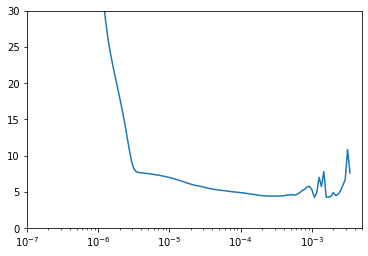

In [61]:
history = model.history
plt.semilogx(history.history['lr'], history.history['loss'])
plt.axis([1e-7, 5e-3, 0, 30])

Based on this graph we should go with 1e-4 as learning rate

In [62]:
optimizer = tf.keras.optimizers.SGD(lr = 4e-3, momentum=0.9)
model.compile(loss=tf.keras.losses.Huber(), optimizer=optimizer, metrics=['mae'])


model.fit(train, validation_data=val, epochs = 500, callbacks=[earlystop])

Epoch 1/500
31/31 [==============================] - 1s 15ms/step - loss: 8.6699 - mae: 9.1584 - val_loss: 19.0019 - val_mae: 19.4998
Epoch 2/500
31/31 [==============================] - 0s 10ms/step - loss: 17.1933 - mae: 17.6890 - val_loss: 17.2326 - val_mae: 17.7292
Epoch 3/500
31/31 [==============================] - 0s 11ms/step - loss: 20.1429 - mae: 20.6395 - val_loss: 27.6529 - val_mae: 28.1500
Epoch 4/500
31/31 [==============================] - 0s 9ms/step - loss: 20.6795 - mae: 21.1767 - val_loss: 18.4150 - val_mae: 18.9102
Epoch 5/500
31/31 [==============================] - 0s 10ms/step - loss: 8.7851 - mae: 9.2727 - val_loss: 14.0276 - val_mae: 14.5253
Epoch 6/500
31/31 [==============================] - 0s 10ms/step - loss: 8.7998 - mae: 9.2885 - val_loss: 6.2344 - val_mae: 6.7237
Epoch 7/500
31/31 [==============================] - 0s 10ms/step - loss: 10.3359 - mae: 10.8239 - val_loss: 5.4124 - val_mae: 5.8870
Epoch 8/500
31/31 [==============================] - 0s 9ms

In [63]:
lin_forecast = model_forecast(model, series[split_time - window:-1], window_size=window)
# We need to pass the time series starting from 30 time step before the start of validation period so that our
# forecast will start at the first time step of the validation period. So there is an overlap which is ignored for
# now
lin_forecast = lin_forecast[:,0]

# Prediction are two dimensional, the first dimension is the batch dimension. In this each instance in the batch
# is small window of 30 timestep and the output is the corresponding forecasts for the next time step. and the second
# dimension is the dimensionality of forecast. So second dimension is 1.

15/15 [==============================] - 0s 7ms/step


In [64]:
tf.keras.metrics.mean_absolute_error(x_val, lin_forecast)  # Not good

<tf.Tensor: shape=(), dtype=float32, numpy=5.7722726>

# Dataloading for Multivariate datapoints:

Till now we saw how to make dataset for univariate series now lets see how to make this for multivariate series by a small example

In [66]:
ds_raw = tf.constant([[i, 1 if i % 3 == 0 else 0] for i in range(0, 100)])
# (feature, label)
ds = tf.data.Dataset.from_tensor_slices(ds_raw)

In [68]:
ds_raw[:10]   # first column is the feature second column is the label

<tf.Tensor: shape=(10, 2), dtype=int32, numpy=
array([[0, 1],
       [1, 0],
       [2, 0],
       [3, 1],
       [4, 0],
       [5, 0],
       [6, 1],
       [7, 0],
       [8, 0],
       [9, 1]])>

In [72]:
windows_size = 5
dataset = ds.window(windows_size+1, shift=1, drop_remainder=True)

In [73]:
dataset = dataset.flat_map(lambda window: window.batch(windows_size+1))
for data in dataset.take(5):
  print(data)

tf.Tensor(
[[0 1]
 [1 0]
 [2 0]
 [3 1]
 [4 0]
 [5 0]], shape=(6, 2), dtype=int32)
tf.Tensor(
[[1 0]
 [2 0]
 [3 1]
 [4 0]
 [5 0]
 [6 1]], shape=(6, 2), dtype=int32)
tf.Tensor(
[[2 0]
 [3 1]
 [4 0]
 [5 0]
 [6 1]
 [7 0]], shape=(6, 2), dtype=int32)
tf.Tensor(
[[3 1]
 [4 0]
 [5 0]
 [6 1]
 [7 0]
 [8 0]], shape=(6, 2), dtype=int32)
tf.Tensor(
[[4 0]
 [5 0]
 [6 1]
 [7 0]
 [8 0]
 [9 1]], shape=(6, 2), dtype=int32)


Now the idea is simply to use clever indexing as shown below which extracts the last window element as label and rest as 
features excluding the labels

In [74]:
dataset = dataset.map(lambda window: (window[:-1, :-1], tf.expand_dims(window[-1, 1], axis=-1)))
dataset = dataset.batch(10)

In [75]:
for a, b in dataset.take(1):
    print(a)
    print(b)

tf.Tensor(
[[[ 0]
  [ 1]
  [ 2]
  [ 3]
  [ 4]]

 [[ 1]
  [ 2]
  [ 3]
  [ 4]
  [ 5]]

 [[ 2]
  [ 3]
  [ 4]
  [ 5]
  [ 6]]

 [[ 3]
  [ 4]
  [ 5]
  [ 6]
  [ 7]]

 [[ 4]
  [ 5]
  [ 6]
  [ 7]
  [ 8]]

 [[ 5]
  [ 6]
  [ 7]
  [ 8]
  [ 9]]

 [[ 6]
  [ 7]
  [ 8]
  [ 9]
  [10]]

 [[ 7]
  [ 8]
  [ 9]
  [10]
  [11]]

 [[ 8]
  [ 9]
  [10]
  [11]
  [12]]

 [[ 9]
  [10]
  [11]
  [12]
  [13]]], shape=(10, 5, 1), dtype=int32)
tf.Tensor(
[[0]
 [1]
 [0]
 [0]
 [1]
 [0]
 [0]
 [1]
 [0]
 [0]], shape=(10, 1), dtype=int32)


In [76]:
for a, b in dataset.take(1):
    print(a.shape)
    print(b.shape)

(10, 5, 1)
(10, 1)


In [77]:
# Lets take another example with real dataset.
# Suppose you have training features and labels for them as:
X = tf.random.normal(shape = (1000, 5))
target = tf.random.uniform(minval=0, maxval=10, shape=(1000,1), dtype=tf.int32)

In [78]:
X.shape

TensorShape([1000, 5])

In [79]:
target.shape

TensorShape([1000, 1])

In [80]:
X[:10]

<tf.Tensor: shape=(10, 5), dtype=float32, numpy=
array([[ 1.1442095 , -1.6089787 , -1.3472221 , -0.6169336 ,  0.8454657 ],
       [ 0.15746248, -0.25251707,  0.95594734,  1.4579884 , -0.28732577],
       [ 0.9258204 ,  0.4794747 , -0.09572995,  0.16096544,  0.7233213 ],
       [-0.05764155, -0.06951454,  0.452149  ,  0.817392  , -0.45869628],
       [ 0.10126186,  0.7052335 ,  0.09353105, -1.7910976 , -1.282595  ],
       [ 1.0777441 ,  2.0670364 , -1.4872679 , -0.7253772 ,  1.3271809 ],
       [ 0.8438021 , -0.22112292,  0.81817585, -0.48515618, -0.73573923],
       [-0.8082096 ,  1.2295301 ,  1.1892542 , -0.2787231 , -0.8816192 ],
       [-0.5822632 , -0.24786586, -1.1826676 , -0.3574739 , -1.5575854 ],
       [-0.06955981, -0.996846  ,  0.62198305, -1.6629487 , -1.3650321 ]],
      dtype=float32)>

In [81]:
target = tf.cast(target, tf.float32)
target[:10]

<tf.Tensor: shape=(10, 1), dtype=float32, numpy=
array([[5.],
       [8.],
       [1.],
       [2.],
       [6.],
       [4.],
       [5.],
       [9.],
       [5.],
       [9.]], dtype=float32)>

In [82]:
dataset = tf.concat([X, target], axis=1)   # Make sure the target is at the last

In [83]:
def create_multivariate_loader(series, window_size=3, batch_size=32):
  AUTOTUNE = tf.data.experimental.AUTOTUNE
  dataset = tf.data.Dataset.from_tensor_slices(series)
  dataset = dataset.window(window_size+1, shift=1, drop_remainder=True)
  dataset = dataset.flat_map(lambda window: window.batch(window_size+1))
  dataset = dataset.map(lambda window: (window[:-1,:-1], tf.expand_dims(window[-1,-1], axis=-1)), num_parallel_calls=AUTOTUNE)
  dataset = dataset.cache().batch(batch_size)
  return dataset.prefetch(AUTOTUNE)

In [84]:
loader = create_multivariate_loader(dataset)

In [85]:
for data, label in loader.take(1):
  print(data.shape)
  print(label.shape)

(32, 3, 5)
(32, 1)


In [86]:
for data, label in loader.take(1):
  print(data)
  print(label)

tf.Tensor(
[[[ 1.1442095e+00 -1.6089787e+00 -1.3472221e+00 -6.1693358e-01
    8.4546572e-01]
  [ 1.5746248e-01 -2.5251707e-01  9.5594734e-01  1.4579884e+00
   -2.8732577e-01]
  [ 9.2582041e-01  4.7947469e-01 -9.5729955e-02  1.6096544e-01
    7.2332132e-01]]

 [[ 1.5746248e-01 -2.5251707e-01  9.5594734e-01  1.4579884e+00
   -2.8732577e-01]
  [ 9.2582041e-01  4.7947469e-01 -9.5729955e-02  1.6096544e-01
    7.2332132e-01]
  [-5.7641555e-02 -6.9514543e-02  4.5214900e-01  8.1739199e-01
   -4.5869628e-01]]

 [[ 9.2582041e-01  4.7947469e-01 -9.5729955e-02  1.6096544e-01
    7.2332132e-01]
  [-5.7641555e-02 -6.9514543e-02  4.5214900e-01  8.1739199e-01
   -4.5869628e-01]
  [ 1.0126186e-01  7.0523351e-01  9.3531050e-02 -1.7910976e+00
   -1.2825950e+00]]

 [[-5.7641555e-02 -6.9514543e-02  4.5214900e-01  8.1739199e-01
   -4.5869628e-01]
  [ 1.0126186e-01  7.0523351e-01  9.3531050e-02 -1.7910976e+00
   -1.2825950e+00]
  [ 1.0777441e+00  2.0670364e+00 -1.4872679e+00 -7.2537720e-01
    1.3271809e+00]

In [87]:
def create_multivariate_loader(series, window_size=3, batch_size=32, buffer=100):
  AUTOTUNE = tf.data.experimental.AUTOTUNE
  dataset = tf.data.Dataset.from_tensor_slices(series)
  dataset = dataset.window(window_size+1, shift=1, drop_remainder=True)
  dataset = dataset.flat_map(lambda window: window.batch(window_size+1))
  dataset = dataset.map(lambda window: (window[:-1,:-1], tf.expand_dims(window[-1,-1], axis=-1)), num_parallel_calls=AUTOTUNE)
  dataset = dataset.cache().shuffle(buffer).batch(batch_size)
  return dataset.prefetch(AUTOTUNE)

# Recurrent Neural Networks

RNN is a neural network that contains recurrent layers and a recurrent layer is a layer that can sequentially
process a sequence of inputs. RNN can take all sort of sequences as input. Here we will learn to process the time
series but later we will see with text as well.

Below shows a RNN with two recurrent layers and one dense layer which serves as the output layer. You can feed it
batch of sequences like windows from time series and it can output a batch of forecast.

One important point that the full input dimension is three dimensional!. first is the batch size, second one is the time series and the last one is the #dim for univariate its always 1 and for rest it can vary. Unlike the above models we train in which we had only two dimensions.

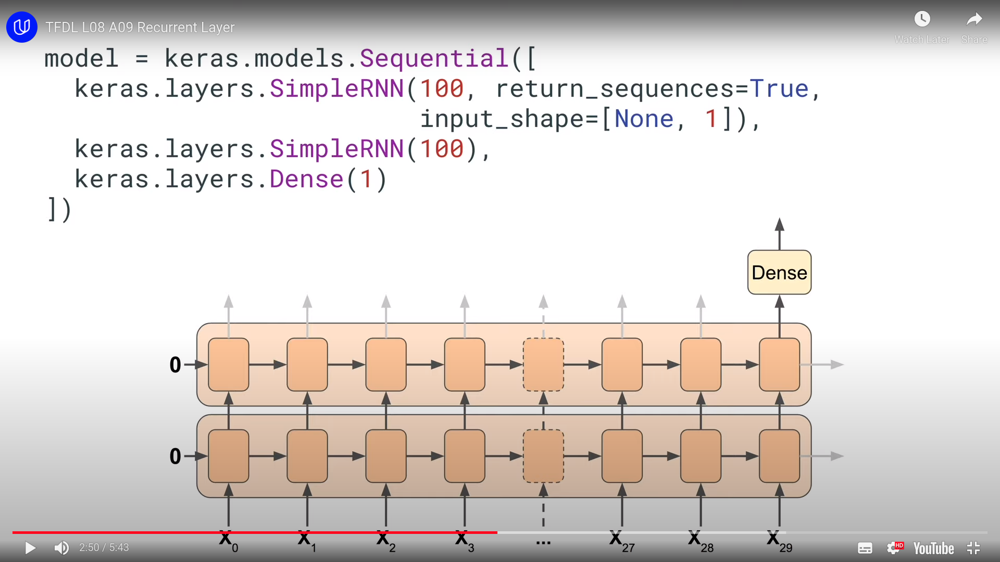

In [69]:
Image(filename='RNN.png')

# Recurrent Layer

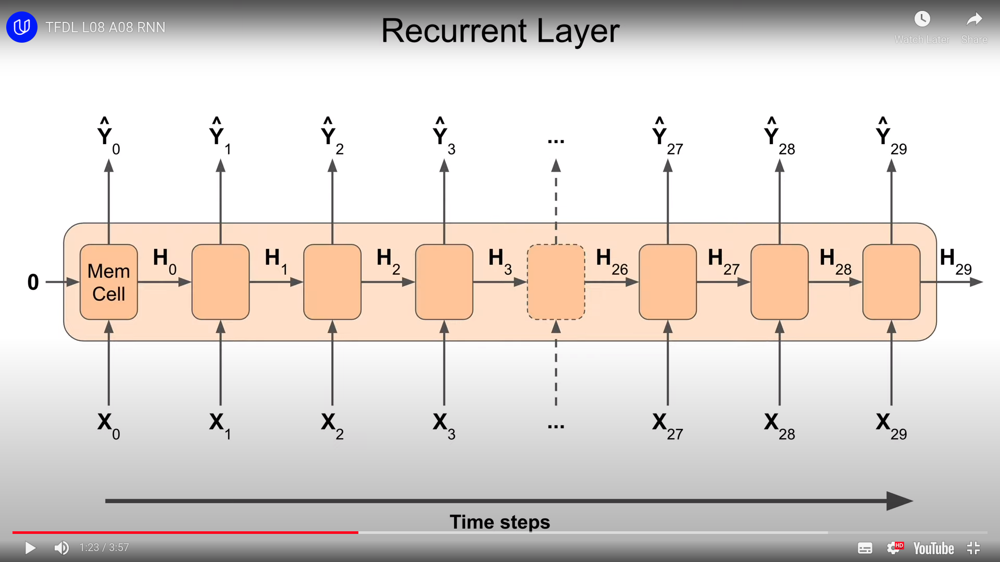

In [70]:
Image(filename='Recurrent Layer.png')

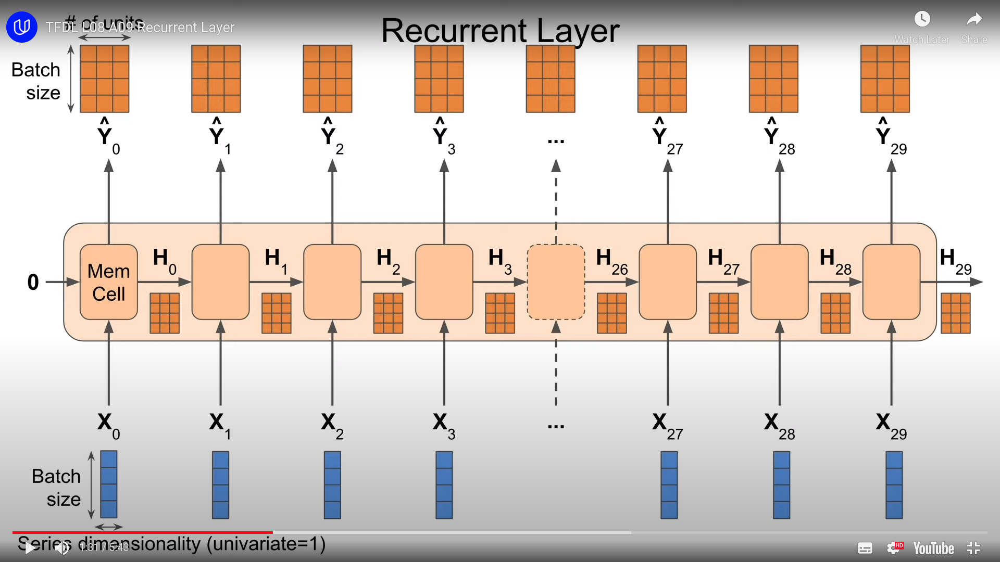

In [88]:
Image(filename='details.png')

Sometimes u want to output not a sequence but a single output for a batch. Sequence to Vector output. Its simple
all you need to do is ignore all outputs except the last one. In keras this is default behaviour. To output a
sequence u need to set the return_sequences = True.

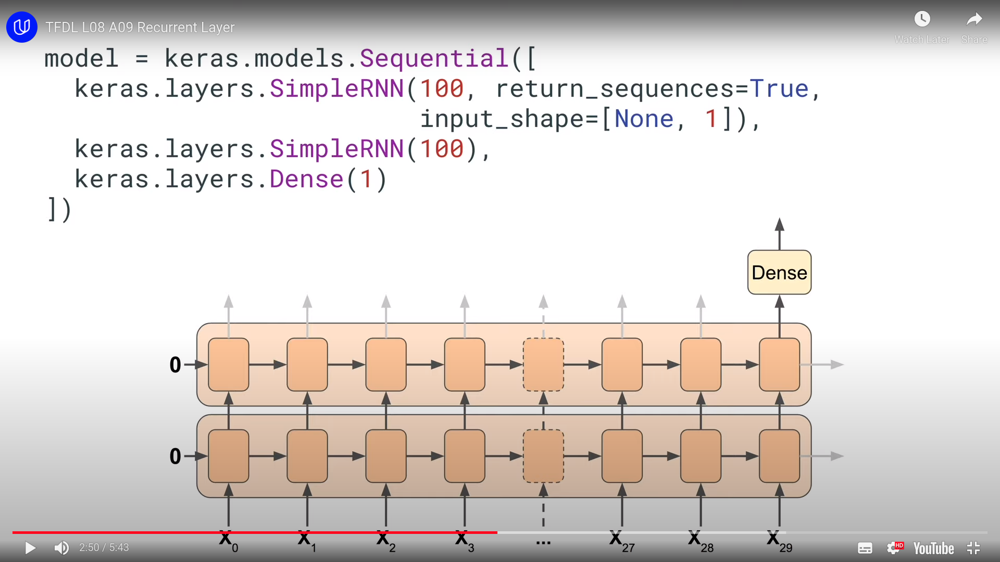

In [72]:
Image(filename='rnn.png')

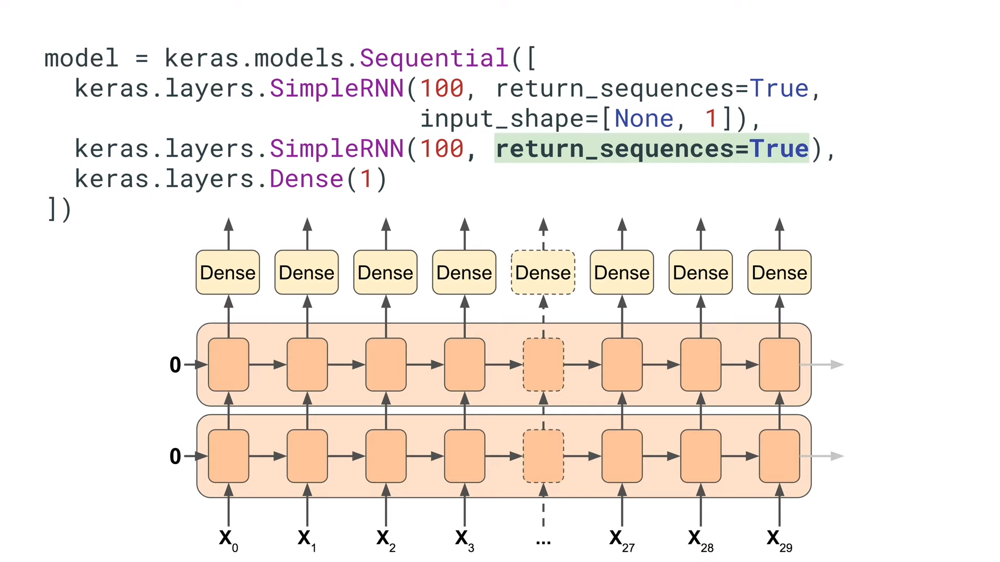

In [73]:
Image(filename='sequence.png')

# Lets train an RNN network now:

# Lambda Layer:

In [90]:
tf.keras.layers.Lambda(lambda x: tf.expand_dims(x, axis=-1), input_shape=[None])

Now since we use hyperbolic tangent function which outputs [-1, 1], and the output range is between [40, 160], in the end we rescale the output again using lambda layer for help in training.

In [91]:
tf.keras.layers.Lambda(lambda x: x*200.0)

In [93]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Lambda(lambda x: tf.expand_dims(x, axis=-1), input_shape=[None]),
    tf.keras.layers.SimpleRNN(100, return_sequences=True),  # Default activation function tanh
    tf.keras.layers.SimpleRNN(100),   # 100 represents the number of memory cell in that layer.
    tf.keras.layers.Dense(1),
    tf.keras.layers.Lambda(lambda x : x * 200.0)
])

# BP through time:

One of the reason why its difficult to train on RNN is that its equivalent of training a fairly deep neural network with one layer per time step. During training, once the loss has been computed backpropagation computes the gradient of loss with regards to every trainable params. in the network and to do so, it propagates the gradients backward through the RNN. This means the gradient flows down the RNN layers, but they also flow backwards through time. Tensorflow does this by unrolling the network through time as shown below, and treating the resulting network as regular feed forward network. So RNN is deep net, the more timesteps there are the more deep it is. Gradients tends to vanish or explode when going through many layers and many time steps. So training could be quite slow especially to detect a long-term patterns.

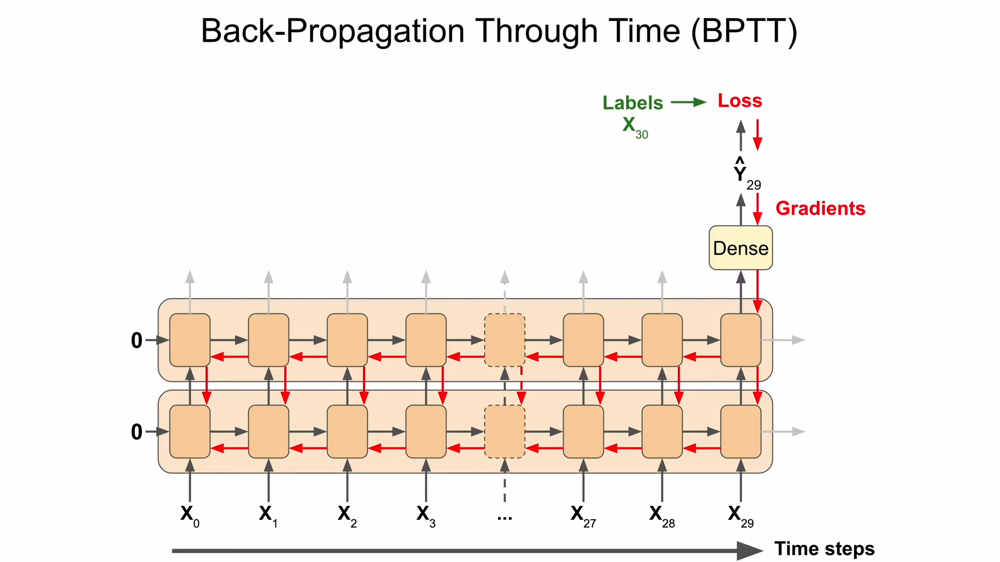

In [77]:
Image(filename='bp.png')

To speed things up one approach is to train the RNN to make a prediction at each and every time step. Instead of a sequence to vector RNN, we now have a sequence to sequence RNN. The labels are just equal to the inputs but just one time step shifted into the future. Example, for time step 0, RNN gets input X_0 and must try to output X_1. At timestep 1, it gets X1 and H0 as input and try to output X2. So instead of looking at the inputs and trying to forecast a single value in this case X_30, the RNN tries to forecast next time step at each and every time step based on the past values.

Advantage: It provides much more of gradient for training. If the forecast is bad at one timestep, there will be a strong loss at that time step and it will be backpropagated directly to update the weights at that time step. This can stabilize and speed up training.

Note: Its just a trick to speed up training, we dont actually care about the outputs excpet for the very last time step.After training we will just drop all the outputs and look pnly at the very last one when we make the prediction.

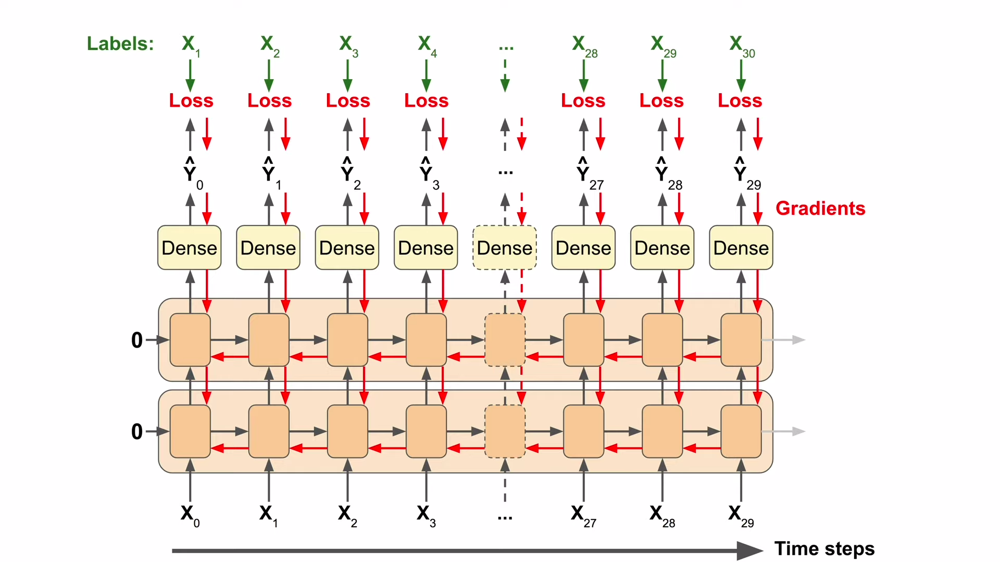

In [94]:
Image(filename='bptime.png')

To implement this sequence to sequence approach, we write a new function that will create a dataset, just like we did earlier except that the labels are now sequences shifted by one time step into the future. Also you might return sequences that have the proper 3d shape for recurrent layers. So that we dont use the lambda layer.(Your choice!)

In [95]:
def sequence_to_sequence(series, window_size, batch_size=32, shuffle_buffer=1000):
    series = tf.expand_dims(series, axis=-1)
    dataset = tf.data.Dataset.from_tensor_slices(series)
    dataset = dataset.window(window_size+1, shift=1, drop_remainder=True)
    dataset = dataset.flat_map(lambda x: x.batch(window_size+1))
    dataset = dataset.map(lambda window: (window[:-1], window[1:]), num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.shuffle(shuffle_buffer).batch(batch_size)
    return dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

In [96]:
window_size = 30
train_set = sequence_to_sequence(x_train, window_size=window_size, batch_size=128)
val_set = sequence_to_sequence(x_val, window_size=window_size, batch_size=128)


In [97]:
for X, Y in train_set:
    print(X.shape)
    print(Y.shape)
    break

(128, 30, 1)
(128, 30, 1)


In [98]:
model = tf.keras.models.Sequential([
    tf.keras.layers.SimpleRNN(100, return_sequences=True, input_shape=[None, 1]),
    # input_shape [timestep, dimensionality], need not to specify batch as keras already knows it while training.
    tf.keras.layers.SimpleRNN(100, return_sequences=True),
    tf.keras.layers.Dense(1),
    tf.keras.layers.Lambda(lambda x : x * 200.0)
])

IMPORTANT: Whenever you are training any model its very important to understand what learning rate to use so start with learning rate scheudler train using it. Then plot and find the good learning rate and then train the final verson of model again.

Tip: For getting the learning rate dont use early stopping there let it train for some number of epochs and when u think u got a decent value train your final model using early stopping.

In [99]:
earlystop = tf.keras.callbacks.EarlyStopping(patience=50)
scheduler = tf.keras.callbacks.LearningRateScheduler(lambda epoch: 1e-6 * 10**(epoch/20))
best_checkpoint = tf.keras.callbacks.ModelCheckpoint('best_model.h5', save_best_only=True)
model.compile(loss=tf.keras.losses.Huber(), optimizer=tf.keras.optimizers.SGD(learning_rate=1e-7, momentum=0.9),
             metrics=['mae'])

In [100]:
history = model.fit(train_set, validation_data=val_set, epochs=100, callbacks=[best_checkpoint, scheduler])

Epoch 1/100
8/8 [==============================] - 5s 357ms/step - loss: 39.6081 - mae: 40.1051 - val_loss: 29.4916 - val_mae: 29.9848 - lr: 1.0000e-06
Epoch 2/100
8/8 [==============================] - 2s 245ms/step - loss: 32.0399 - mae: 32.5358 - val_loss: 21.3398 - val_mae: 21.8330 - lr: 1.1220e-06
Epoch 3/100
8/8 [==============================] - 2s 284ms/step - loss: 23.7813 - mae: 24.2752 - val_loss: 15.5964 - val_mae: 16.0828 - lr: 1.2589e-06
Epoch 4/100
8/8 [==============================] - 2s 264ms/step - loss: 17.4622 - mae: 17.9541 - val_loss: 12.0014 - val_mae: 12.4835 - lr: 1.4125e-06
Epoch 5/100
8/8 [==============================] - 2s 244ms/step - loss: 13.5054 - mae: 13.9937 - val_loss: 11.6993 - val_mae: 12.1889 - lr: 1.5849e-06
Epoch 6/100
8/8 [==============================] - 2s 243ms/step - loss: 12.5767 - mae: 13.0656 - val_loss: 11.2178 - val_mae: 11.7089 - lr: 1.7783e-06
Epoch 7/100
8/8 [==============================] - 2s 239ms/step - loss: 11.7242 - mae: 

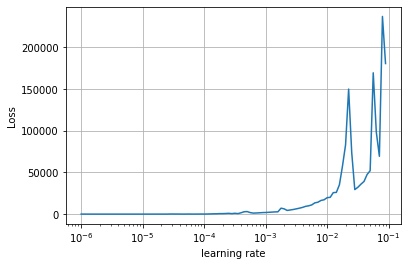

In [101]:
plt.plot(history.history['lr'], history.history['loss'])
plt.xlabel('learning rate')
plt.ylabel('Loss')
plt.xscale('log')
plt.grid()

In [102]:
model.compile(loss=tf.keras.losses.Huber(), optimizer=tf.keras.optimizers.SGD(learning_rate=4e-3, momentum=0.9),
             metrics=['mae'])

In [103]:
history = model.fit(train_set, validation_data=val_set, epochs=500, callbacks=[earlystop, best_checkpoint])

Epoch 1/500
8/8 [==============================] - 4s 275ms/step - loss: 140795.9375 - mae: 140796.4375 - val_loss: 94954.1094 - val_mae: 94954.6094
Epoch 2/500
8/8 [==============================] - 2s 241ms/step - loss: 71215.2344 - mae: 71215.7344 - val_loss: 98785.7734 - val_mae: 98786.2734
Epoch 3/500
8/8 [==============================] - 2s 227ms/step - loss: 53617.1445 - mae: 53617.6523 - val_loss: 15034.4238 - val_mae: 15034.9229
Epoch 4/500
8/8 [==============================] - 2s 237ms/step - loss: 25610.9043 - mae: 25611.4082 - val_loss: 14727.2275 - val_mae: 14727.7275
Epoch 5/500
8/8 [==============================] - 2s 229ms/step - loss: 24265.9473 - mae: 24266.4473 - val_loss: 13356.0654 - val_mae: 13356.5635
Epoch 6/500
8/8 [==============================] - 2s 231ms/step - loss: 25031.1816 - mae: 25031.6816 - val_loss: 11502.2773 - val_mae: 11502.7773
Epoch 7/500
8/8 [==============================] - 2s 229ms/step - loss: 25904.4102 - mae: 25904.9102 - val_loss: 24

KeyboardInterrupt: 

In [88]:
model = tf.keras.models.load_model('best_model.h5')

In [89]:
lin_forecast = model_forecast(model, series[...,np.newaxis], window_size=window_size)

In [90]:
lin_forecast.shape

(1432, 30, 1)

In [91]:
rnn_forecast = lin_forecast[split_time-window_size:-1, -1, 0]

In [92]:
tf.keras.metrics.mean_absolute_error(x_val, rnn_forecast)

<tf.Tensor: shape=(), dtype=float32, numpy=7.7938223>

# Stateful vs Stateless RNN:

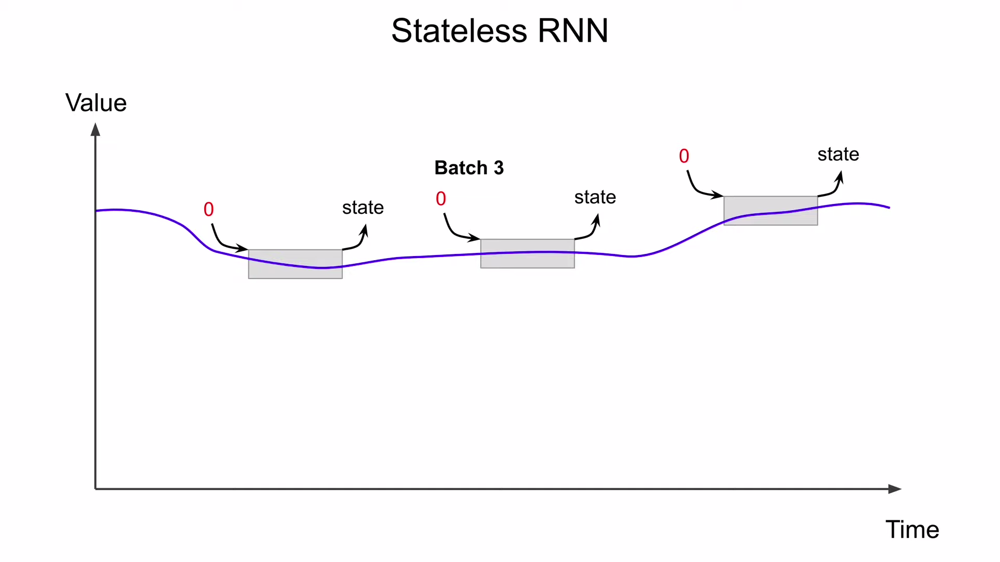

In [93]:
Image(filename='state.png')

# Stateful RNN

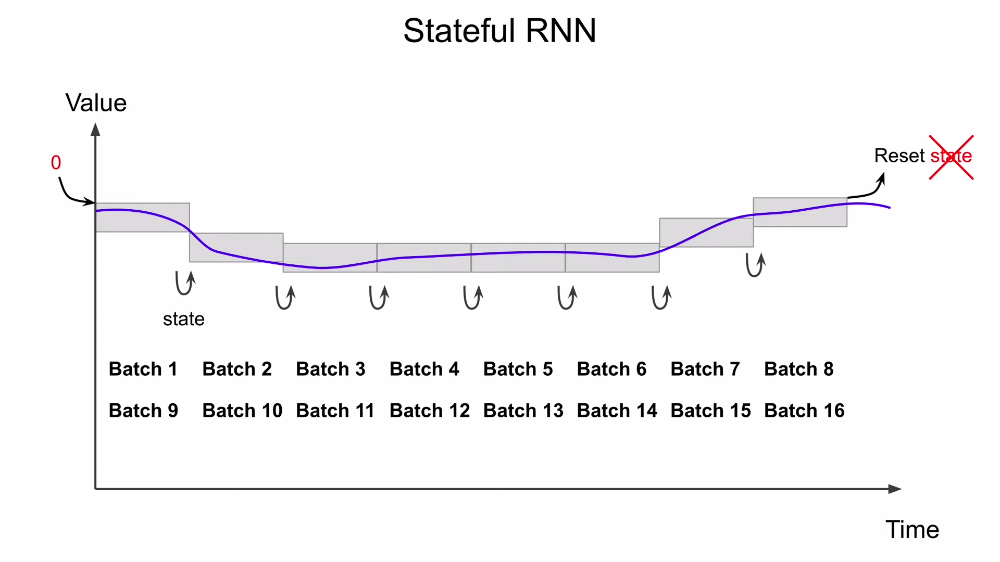

In [94]:
Image(filename='stateful.png')

# Lets Implement Stateful RNN:

In [95]:
def sequential_window_dataset(series, window_size):
    dataset = tf.expand_dims(series, axis=-1)
    dataset = tf.data.Dataset.from_tensor_slices(dataset)
    dataset = dataset.window(window_size+1, shift=window_size, drop_remainder=True)
    # shift=window_size will ensure that each window will immediately follow the previous window.
    dataset = dataset.flat_map(lambda window: window.batch(window_size+1))
    dataset = dataset.map(lambda window: (window[:-1], window[1:]), num_parallel_calls=tf.data.AUTOTUNE)
    return dataset.batch(1).prefetch(tf.data.AUTOTUNE)

    # we do not shuffle window anymore as they need to be consecutive. Lastly we use batches containing a 
    # single window

In [57]:
series.shape

(1461,)

In [97]:
for X, Y in sequential_window_dataset(tf.range(10), window_size=3):
    print('X: ', X)
    print('Y: ', Y)
    print('\n')

X:  tf.Tensor(
[[[0]
  [1]
  [2]]], shape=(1, 3, 1), dtype=int32)
Y:  tf.Tensor(
[[[1]
  [2]
  [3]]], shape=(1, 3, 1), dtype=int32)


X:  tf.Tensor(
[[[3]
  [4]
  [5]]], shape=(1, 3, 1), dtype=int32)
Y:  tf.Tensor(
[[[4]
  [5]
  [6]]], shape=(1, 3, 1), dtype=int32)


X:  tf.Tensor(
[[[6]
  [7]
  [8]]], shape=(1, 3, 1), dtype=int32)
Y:  tf.Tensor(
[[[7]
  [8]
  [9]]], shape=(1, 3, 1), dtype=int32)




In [98]:
window_size = 39
train_set = sequential_window_dataset(x_train, window_size)
val_set = sequential_window_dataset(x_val, window_size)

model = tf.keras.models.Sequential([
    tf.keras.layers.SimpleRNN(100, return_sequences=True, stateful=True,
                             batch_input_shape=[1, None, 1]),
    # Keras has to know how many state vectors it will have to preserve between each training iteration, so
    # we specify the batch_input_shape instead of input_shape, [batchsize, timestep, dimensionality]
    tf.keras.layers.SimpleRNN(100, return_sequences=True, stateful=True),
    tf.keras.layers.Dense(1),
    tf.keras.layers.Lambda(lambda X: X * 200.0)
])

This also means that this RNN will only be usable with batches of size 1 both during training and after training, another sever limitation.

In [99]:
optimizer = tf.keras.optimizers.SGD(learning_rate=1e-7, momentum=0.9)
model.compile(loss=tf.keras.losses.huber, optimizer=optimizer, metrics=['mae'])
model_checkpoint = tf.keras.callbacks.ModelCheckpoint('best.h5', save_best_only=True)
early = tf.keras.callbacks.EarlyStopping(patience=50)

We also need to reset the states and the beginning of each epoch

In [100]:
class ResetState(tf.keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs):
        self.model.reset_states()
        
reset_states = ResetState()

In [101]:
model.fit(train_set, validation_data=val_set, epochs=500, callbacks=[model_checkpoint, early, reset_states])

Epoch 1/500
33/33 [==============================] - 3s 38ms/step - loss: 98.5961 - mae: 99.0951 - val_loss: 27.8297 - val_mae: 28.3245
Epoch 2/500
33/33 [==============================] - 1s 18ms/step - loss: 42.1393 - mae: 42.6351 - val_loss: 28.6797 - val_mae: 29.1759
Epoch 3/500
33/33 [==============================] - 1s 19ms/step - loss: 28.8967 - mae: 29.3938 - val_loss: 17.4322 - val_mae: 17.9265
Epoch 4/500
33/33 [==============================] - 1s 22ms/step - loss: 23.4263 - mae: 23.9210 - val_loss: 15.1565 - val_mae: 15.6472
Epoch 5/500
33/33 [==============================] - 1s 23ms/step - loss: 19.9987 - mae: 20.4928 - val_loss: 14.2464 - val_mae: 14.7358
Epoch 6/500
33/33 [==============================] - 1s 19ms/step - loss: 17.5700 - mae: 18.0602 - val_loss: 13.1926 - val_mae: 13.6835
Epoch 7/500
33/33 [==============================] - 1s 19ms/step - loss: 15.7715 - mae: 16.2628 - val_loss: 12.4192 - val_mae: 12.9059
Epoch 8/500
33/33 [=============================

Epoch 62/500
33/33 [==============================] - 1s 20ms/step - loss: 7.5358 - mae: 8.0144 - val_loss: 7.7220 - val_mae: 8.1961
Epoch 63/500
33/33 [==============================] - 1s 18ms/step - loss: 7.4905 - mae: 7.9688 - val_loss: 7.6942 - val_mae: 8.1679
Epoch 64/500
33/33 [==============================] - 1s 20ms/step - loss: 7.4462 - mae: 7.9242 - val_loss: 7.6670 - val_mae: 8.1402
Epoch 65/500
33/33 [==============================] - 1s 28ms/step - loss: 7.4019 - mae: 7.8800 - val_loss: 7.6402 - val_mae: 8.1129
Epoch 66/500
33/33 [==============================] - 1s 22ms/step - loss: 7.3585 - mae: 7.8367 - val_loss: 7.6140 - val_mae: 8.0866
Epoch 67/500
33/33 [==============================] - 1s 20ms/step - loss: 7.3152 - mae: 7.7933 - val_loss: 7.5879 - val_mae: 8.0603
Epoch 68/500
33/33 [==============================] - 1s 23ms/step - loss: 7.2726 - mae: 7.7505 - val_loss: 7.5628 - val_mae: 8.0347
Epoch 69/500
33/33 [==============================] - 1s 24ms/step - 

33/33 [==============================] - 1s 19ms/step - loss: 5.4739 - mae: 5.9505 - val_loss: 6.5819 - val_mae: 7.0556
Epoch 185/500
33/33 [==============================] - 1s 18ms/step - loss: 5.4672 - mae: 5.9437 - val_loss: 6.5797 - val_mae: 7.0533
Epoch 186/500
33/33 [==============================] - 1s 23ms/step - loss: 5.4606 - mae: 5.9369 - val_loss: 6.5775 - val_mae: 7.0509
Epoch 187/500
33/33 [==============================] - 1s 23ms/step - loss: 5.4541 - mae: 5.9302 - val_loss: 6.5752 - val_mae: 7.0485
Epoch 188/500
33/33 [==============================] - 1s 21ms/step - loss: 5.4476 - mae: 5.9235 - val_loss: 6.5728 - val_mae: 7.0460
Epoch 189/500
33/33 [==============================] - 1s 23ms/step - loss: 5.4411 - mae: 5.9169 - val_loss: 6.5704 - val_mae: 7.0436
Epoch 190/500
33/33 [==============================] - 1s 25ms/step - loss: 5.4347 - mae: 5.9103 - val_loss: 6.5680 - val_mae: 7.0412
Epoch 191/500
33/33 [==============================] - 1s 25ms/step - loss: 

33/33 [==============================] - 1s 19ms/step - loss: 4.9001 - mae: 5.3696 - val_loss: 6.3854 - val_mae: 6.8641
Epoch 307/500
33/33 [==============================] - 1s 19ms/step - loss: 4.8968 - mae: 5.3663 - val_loss: 6.3845 - val_mae: 6.8633
Epoch 308/500
33/33 [==============================] - 1s 23ms/step - loss: 4.8936 - mae: 5.3631 - val_loss: 6.3837 - val_mae: 6.8624
Epoch 309/500
33/33 [==============================] - 2s 53ms/step - loss: 4.8904 - mae: 5.3598 - val_loss: 6.3828 - val_mae: 6.8616
Epoch 310/500
33/33 [==============================] - 1s 19ms/step - loss: 4.8873 - mae: 5.3566 - val_loss: 6.3820 - val_mae: 6.8608
Epoch 311/500
33/33 [==============================] - 1s 29ms/step - loss: 4.8841 - mae: 5.3534 - val_loss: 6.3811 - val_mae: 6.8599
Epoch 312/500
33/33 [==============================] - 1s 18ms/step - loss: 4.8810 - mae: 5.3502 - val_loss: 6.3802 - val_mae: 6.8591
Epoch 313/500
33/33 [==============================] - 1s 18ms/step - loss: 

33/33 [==============================] - 1s 21ms/step - loss: 4.5767 - mae: 5.0433 - val_loss: 6.2925 - val_mae: 6.7727
Epoch 429/500
33/33 [==============================] - 1s 32ms/step - loss: 4.5745 - mae: 5.0411 - val_loss: 6.2920 - val_mae: 6.7723
Epoch 430/500
33/33 [==============================] - 1s 20ms/step - loss: 4.5723 - mae: 5.0390 - val_loss: 6.2915 - val_mae: 6.7718
Epoch 431/500
33/33 [==============================] - 1s 25ms/step - loss: 4.5702 - mae: 5.0368 - val_loss: 6.2910 - val_mae: 6.7714
Epoch 432/500
33/33 [==============================] - 1s 40ms/step - loss: 4.5680 - mae: 5.0347 - val_loss: 6.2904 - val_mae: 6.7709
Epoch 433/500
33/33 [==============================] - 1s 27ms/step - loss: 4.5659 - mae: 5.0325 - val_loss: 6.2899 - val_mae: 6.7703
Epoch 434/500
33/33 [==============================] - 1s 19ms/step - loss: 4.5638 - mae: 5.0304 - val_loss: 6.2893 - val_mae: 6.7698
Epoch 435/500
33/33 [==============================] - 1s 20ms/step - loss: 

In [102]:
model = tf.keras.models.load_model('best.h5')

In [103]:
model.reset_states()
rnn_forecast = model.predict(series[np.newaxis,:,np.newaxis])
# As model expects three dimension [batch, timestep, dimensionality]
rnn_forecast = rnn_forecast[0, split_time-1:-1,0] # extracting for validation set

In [104]:
rnn_forecast.shape

(461,)

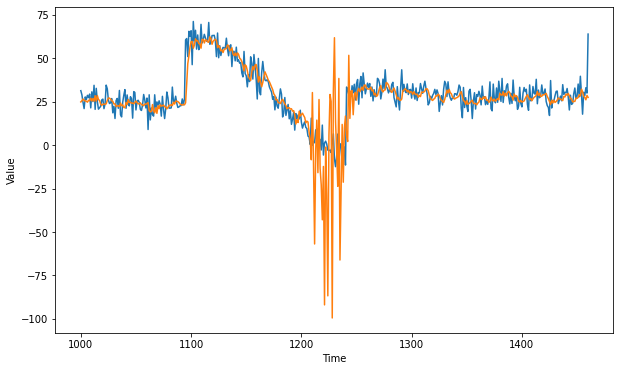

In [105]:
plt.figure(figsize=(10, 6))
plot_series(time_val, x_val)
plot_series(time_val, rnn_forecast)

Not so good we need to tune the model as finding good learning rate etc like before and then try again!

In [106]:
tf.keras.metrics.mean_absolute_error(x_val, rnn_forecast)

<tf.Tensor: shape=(), dtype=float32, numpy=6.7735434>

# LSTM Cells:

It helps the model learn long term dependencies. It stands for long short term memory cells. This is what it looks like

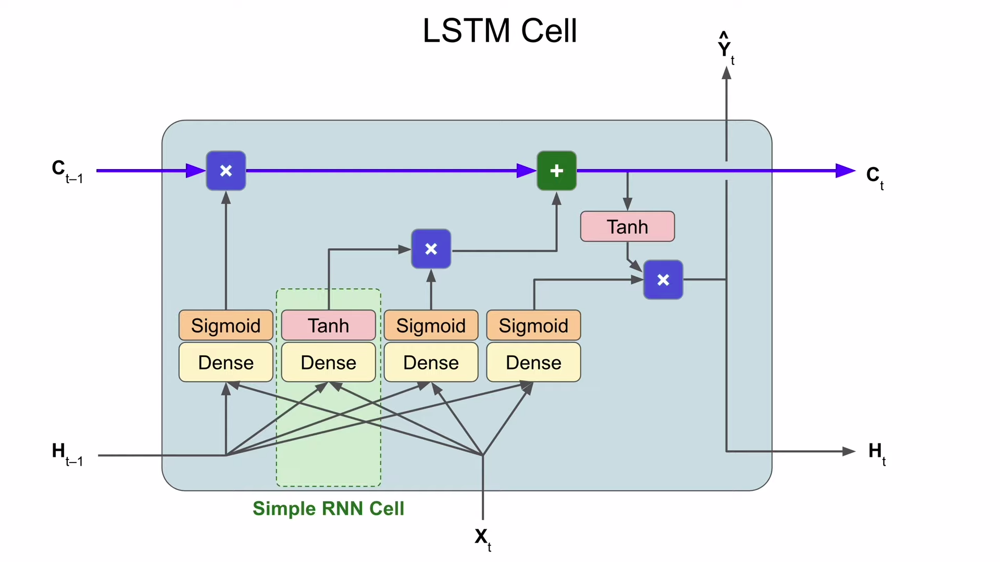

In [107]:
Image(filename='lstm.png')

This extra complexity is worth it. It has much longer memory than simple RNN cells. You can see part of the cell is just a good enough old simple RNN cell, meaning a dense layer and tanh activation function, which takes as input X_t, input at current timestep and Ht-1 which is the previous state.All the other component gives the cell a long term memory rather a longer term memory hence the name. It can detect patters over a 100 timestep long, but it will still struggle with patterns of several hundreds timesteps or more.

First it has a state vector which gets transmitted through one time step to the next i.e. Ht-1 and Ht. It also has a second state vector, which u can think of long term state vector. Notice that it goes through the cell through just two simple operation at each time step, a multiplication and an addition. Both are element wise operation.

Because it goes through the cell with few computations, gradients can flow smoothly without vanishing and exploding too much. This what gives LSTM longer memory and its the key idea.

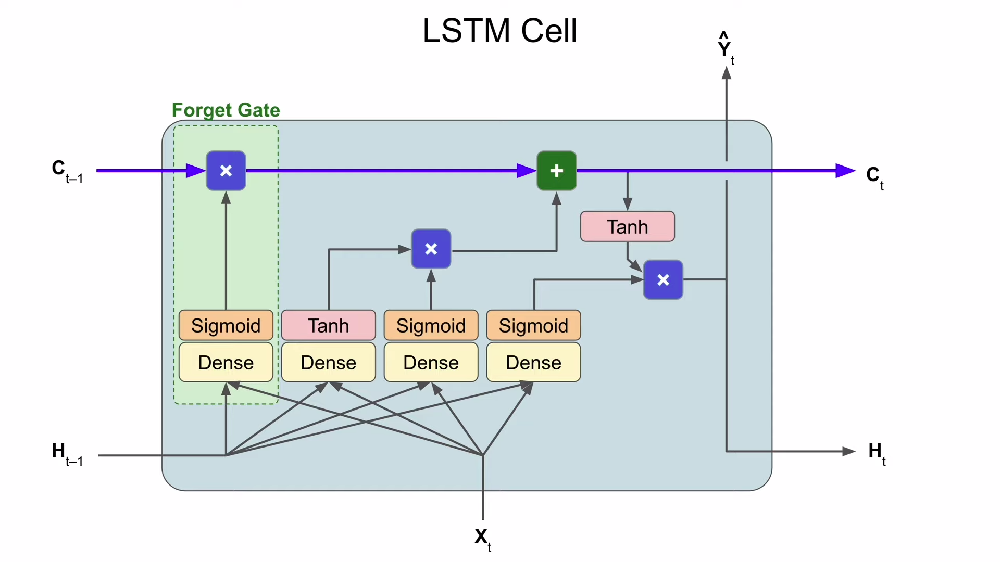

In [108]:
Image(filename='forget.png')

The forget Gate, its just a dense layer with sigmoid, it outputs value between 0 to 1. It has the same input as simple RNN cell, Xt and Ht-1, Its output dimension is same as long term state vector, so both can be multiplied item wise. If the element get multiplied by 1 or close to 1, then that component of Ct-1 will remain unchanged, means in the long run that value will be retained, value which gets multiplied by 0 or close to 0, its forgotten.

During training the forget Gate, will gradually learn when to erase part of the long term memory.

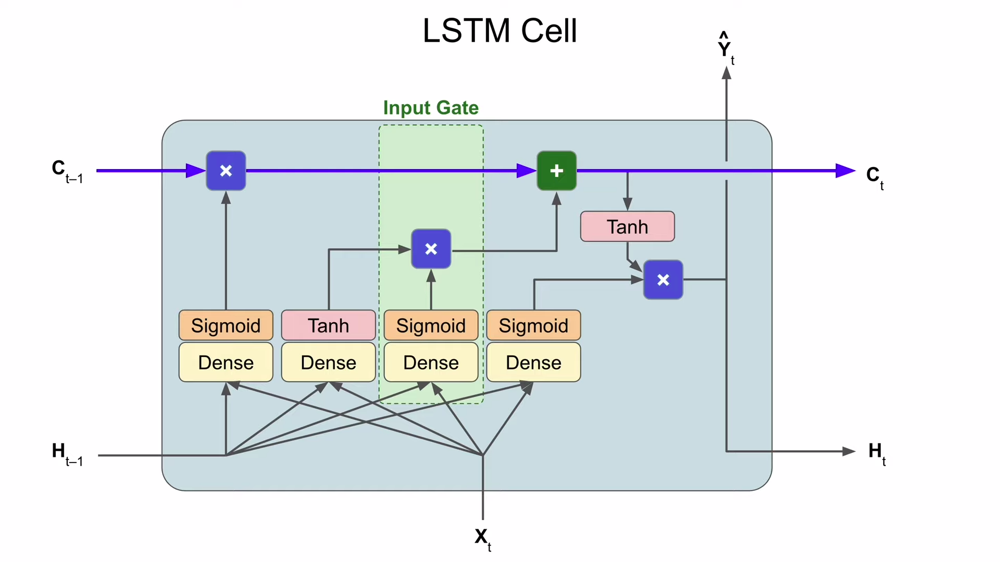

In [109]:
Image(filename='input.png')

The Input Gate, It learns when it should store the information in the long term memory. It has same inputs as the simple RNN cell. It also uses sigmoid which will output the value between 0 to 1. If it outputs 1, the value is retained else removed, the result is then added to the long term vector. If zero then the value will not be added to the long term state vector. So in short, this input gate decides when its time to remember something. Suppose it gets a new upward trend which wasnt there before, it might want to add this information to the long term state vector.

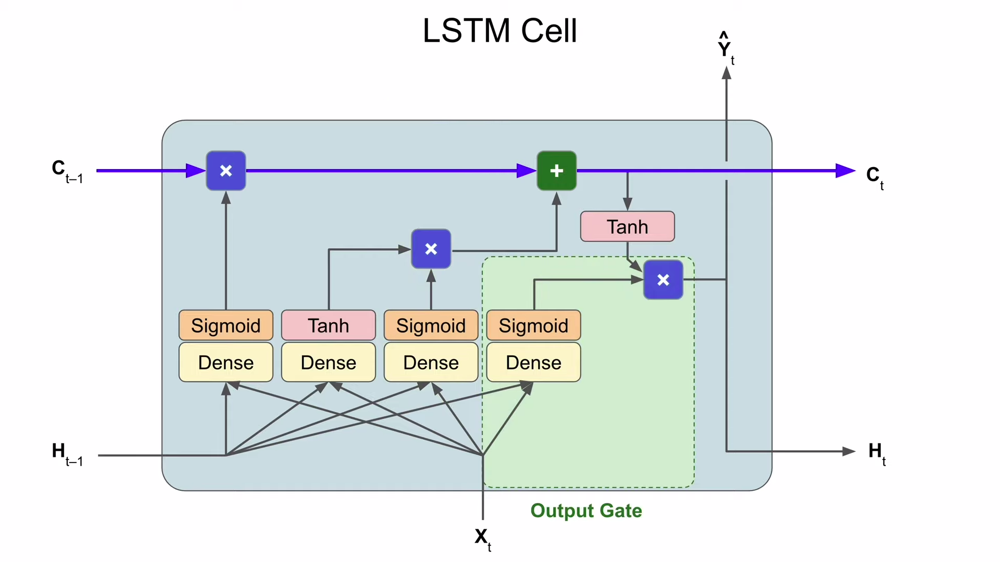

In [110]:
Image(filename='output.png')

The Output Gate, It learns which part of the long term state vector it should output at each timestep. Once again it outputs value from 0 to 1, and this gives a mask which can be multiplied by the long term state vector atleast after it goes through a tanh function. This gives the output for the current timestep. Note that Ht = Yt. The output at current timestep is equal to the current state vector.

In [111]:
model = tf.keras.models.Sequential([
    tf.keras.layers.LSTM(100, return_sequences=True, stateful=True, batch_input_shape=[1, None, 1]),
    tf.keras.layers.LSTM(100, return_sequences=True, stateful=True),
    tf.keras.layers.Dense(1),
    tf.keras.layers.Lambda(lambda X : X * 200.0)
])

Or, another way which is slower, is to include a LSTMcell inside RNN, slower as is LSTM above itself applies some sort of optimization and will use NVIDIA GPU, if available.

In [112]:
model = tf.keras.models.Sequential([
    tf.keras.layers.RNN(tf.keras.layers.LSTMCell(100),
                        return_sequences=True, stateful=True, batch_input_shape=[1, None, 1]),
    tf.keras.layers.RNN(tf.keras.layers.LSTMCell(100), return_sequences=True, stateful=True),
    tf.keras.layers.Dense(1),
    tf.keras.layers.Lambda(lambda X : X * 200.0)
])

FOr LSTM, better to use GPU, as it goes through lot of computation!

In [ ]:
tf.keras.backend.clear_session()
tf.random.set_seed(42)
np.random.seed(42)

window_size = 30
train_set = sequential_window_dataset(x_train, window_size)
valid_set = sequential_window_dataset(x_val, window_size)

model = tf.keras.models.Sequential([
  tf.keras.layers.LSTM(100, return_sequences=True, stateful=True,
                         batch_input_shape=[1, None, 1]),
  tf.keras.layers.LSTM(100, return_sequences=True, stateful=True),
  tf.keras.layers.Dense(1),
  tf.keras.layers.Lambda(lambda x: x * 200.0)
])
lr_schedule = tf.keras.callbacks.LearningRateScheduler(
    lambda epoch: 1e-8 * 10**(epoch / 20))
optimizer = tf.keras.optimizers.SGD(lr=1e-8, momentum=0.9)
model.compile(loss=tf.keras.losses.Huber(),
              optimizer=optimizer,
              metrics=["mae"])

model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    "my_checkpoint.h5", save_best_only=True)
#early_stopping = keras.callbacks.EarlyStopping(patience=50)
history = model.fit(train_set, epochs=100,
          validation_data=valid_set,
          callbacks=[model_checkpoint, reset_states,lr_schedule])

In [ ]:
plt.semilogx(history.history["lr"], history.history["loss"])
plt.axis([1e-8, 1e-4, 0, 30])

Find the proper one and train again!

# ConvNets:

They are also very efficient in handling sequences. A 1d convolution is just like a 2d layer except, ofcourse, it slides filters across just one dimension, typically the time axis in a time series instead of sliding them across two-dimensions, typically width and height of image. For example, this is a simple 1d convolutional layer with a filter of size 3. Since the filter/kernal is of size 3, each output is only computed based on three input time steps. In this example the layer computes a weighted sum of the values at the first three time steps plus a bias term and it applies an activation function, typically Relu and gives the first output. The layer slides the filter across the input sequence. The first output was computed based on the inputs at time steps 0, 1, 2. Now the second output is computed based on 1, 2 and 3. i.e. ReLU(w0X1 + W1X2 + W2X3 + b) similarly we slide further computing the output until we reach the end of the input. So just like RNN, 1D convolution layer can handle sequences of any length. Parameters depedns on the kernel size and the number of kernels used. However 1D convolution has no memory at all unlike RNN.

As we will see if you stack multiple 1D convolution layers, the top layers end up indirectly seeing a large part of the input sequence. So COnvNet can actually capture very long patterns.

Parameters: Kernel Size, number of kernels. Even in vision it is preferred to use multiple small kernels rather than small number of large kernels(example VGG net)

Padding: Default (no paddding at all i.e. valid padding), meaning the output sequence will be slightly shorter than the input sequence. Like in below second image we use the filter size 3, output ended up being two time steps smaller than the input sequence. If u pad with padding='SAME', it will automatically pad the input sequence with enough zeros left and right to ensure that the output sequence is of same length as the input sequence.

Another type of padding is the causal padding, instead of padding zeros left and right, here they are added only left side in the past.

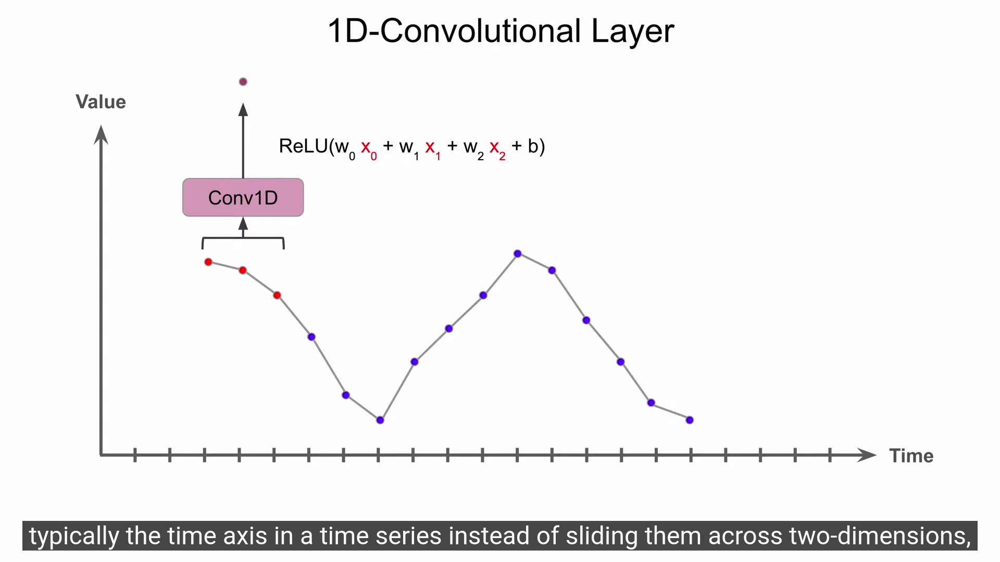

In [113]:
Image(filename='convd.png')

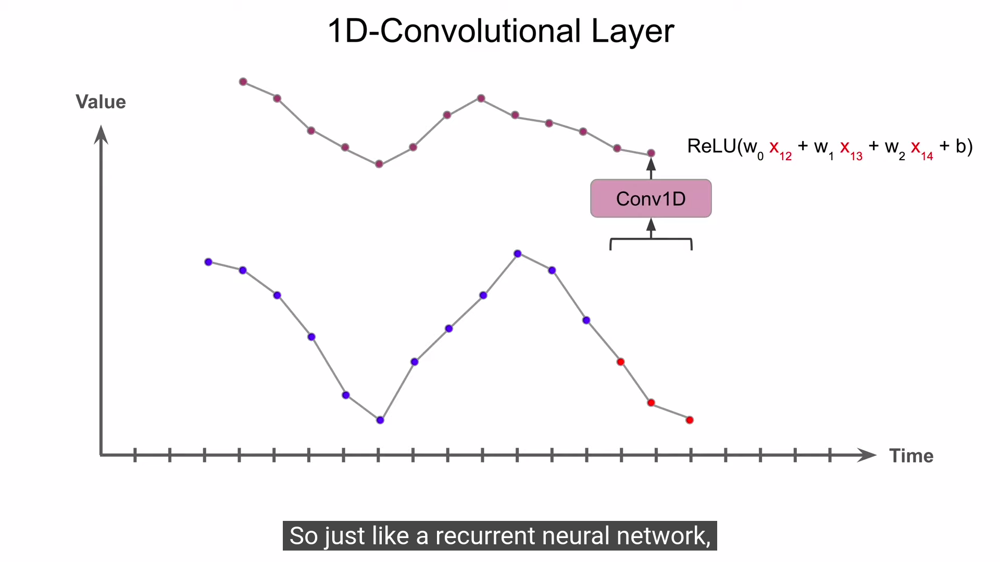

In [114]:
Image(filename='convend.png')

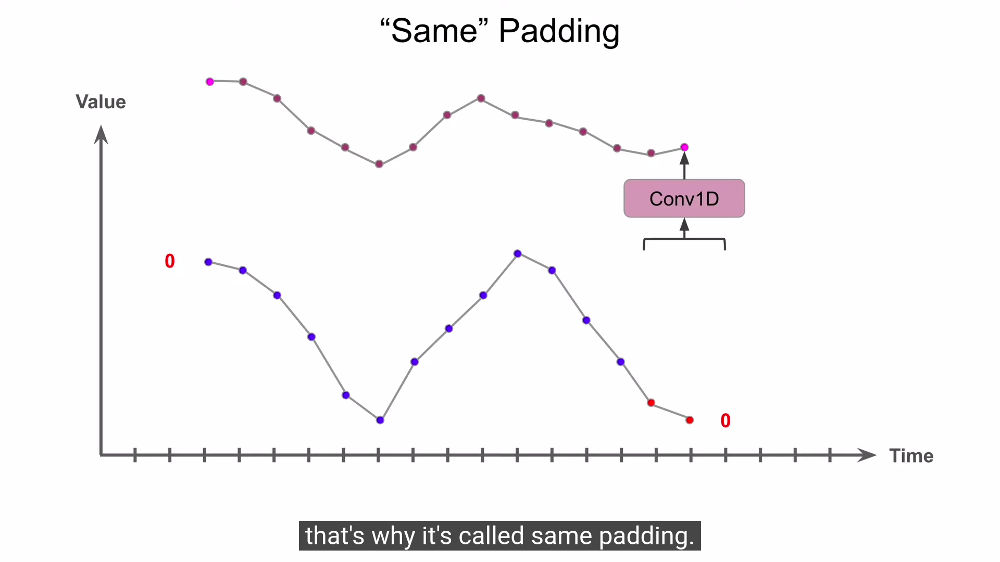

In [115]:
Image(filename='same.png')

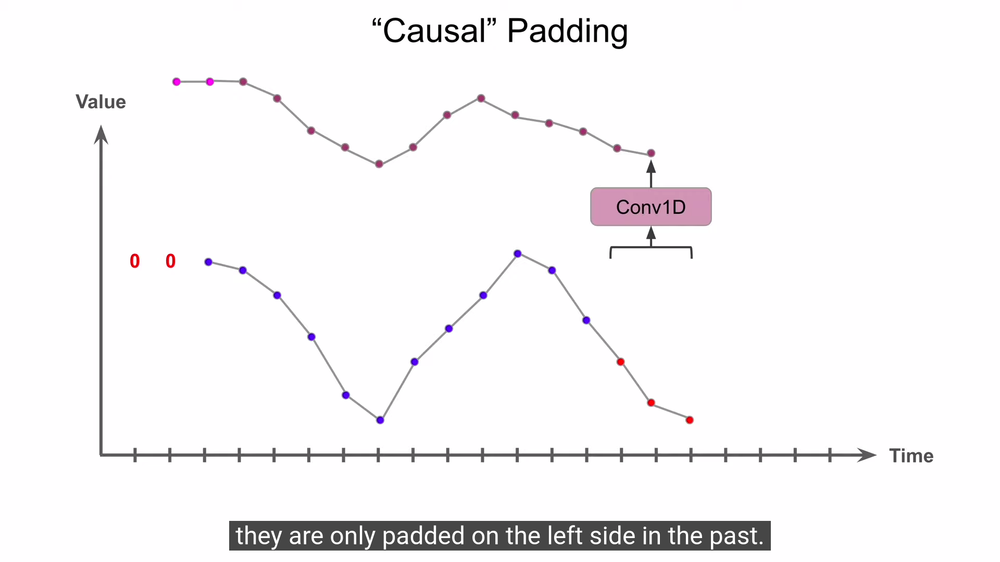

In [116]:
Image(filename='causal.png')

Another Hyperparameter is the stride, meaning by what amount the filter should slide, default is 1, i.e. the filter will slide by only one time step. It can be used to shorten the input sequence. Say you use a convolutional layer with stride of 2, to shorten the input sequence and pass the resulting shorter sequence to recurrent neural network. If RNN wasnt able to perform due to presence of long term patters, now after applying the convnets with strides the sequence will become smaller and now RNN might perform better. So a 1D convolutional layers can be used as preprocessing layers before an RNN and it can help improve the performance.

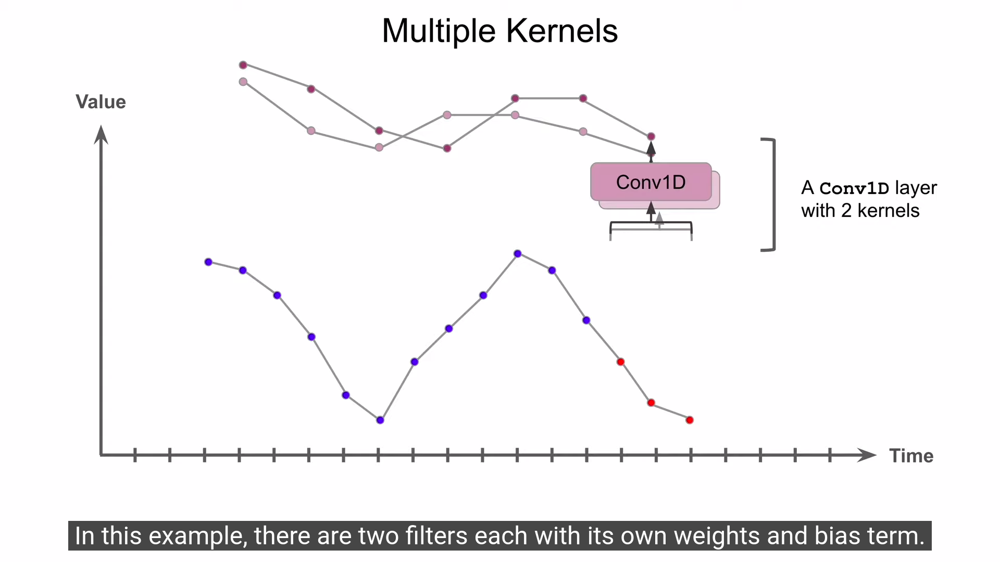

In [117]:
Image(filename='kernels.png')

Another hyperparameter is the number of kernels to use. In above example we see two kernels with its own weights and bias term. So the output sequence will have two values at each timestep. In other words the output sequence dimensionality will be two. Its a multivariate time series. The number of filters is something that you have to tune if you set it to something that is too low, the model will perform poorly. But if set too high it is likely to overfit and generalize poorly. Here is an example to a COnvd layers used as preprocessing before passing it to the LSTM layers.

Note Input Shape for 1d convolution should be atleast 3 dimension:
3+D tensor with shape: batch_shape + (steps, input_dim)

In [118]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv1D(filters=32, kernel_size=5, strides=1, padding='causal', activation='relu',
                          input_shape=[None, 1]),
    # This convnet can learn to detect short term patterns that are most useful for the RNN.
    tf.keras.layers.LSTM(32, return_sequences=True),
    tf.keras.layers.LSTM(32, return_sequences=True),
    tf.keras.layers.Dense(1),
    tf.keras.layers.Lambda(lambda X: X*200.0)
])

In [ ]:
import os
import pandas as pd
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'


def plot_series(time, series, format='-', start=0, end=None, label=None):
    # series is the value at each timestep.
    plt.plot(time[start:end], series[start:end], format, label=label)
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.grid()

    if label:
        plt.legend(fontsize=14)
    plt.show()


if __name__ == '__main__':
    # Let's load the dataset
    dataset = pd.read_csv(os.path.join('Dataset', 'daily-min-temperatures.csv'))
    ''' print(dataset.head())
    print(dataset.tail(365))

    print(len(dataset))'''

    time = np.arange(len(dataset))
    series = dataset.Temp.values
    # print(series[-365:])
    # plot_series(time, series)

    dataset = dataset[:-365]
    test = dataset[-365:]
    print(test.head())

    train_len = int(len(dataset) * 0.8)
    train = dataset[:train_len]
    val = dataset[train_len:]
    print(len(train))
    print(len(val))

    train = train.iloc[:, -1]
    val = val.iloc[:, -1]
    test = test.iloc[:, -1]

    # Let's standardize the dataset.
    mean = train.mean()
    std = train.std() + 1e-12

    train = (train - mean) / std
    val = (val - mean) / std
    test = (test - mean) / std

    print(train.head())


    def sequence_to_sequence(series, window_size, batch_size=32, shuffle_buffer=1000):
        series = tf.expand_dims(series, axis=-1)
        dataset = tf.data.Dataset.from_tensor_slices(series)
        dataset = dataset.window(window_size + 1, shift=1, drop_remainder=True)
        dataset = dataset.flat_map(lambda x: x.batch(window_size + 1))
        dataset = dataset.map(lambda window: (window[:-1], window[1:]), num_parallel_calls=tf.data.AUTOTUNE)
        dataset = dataset.shuffle(shuffle_buffer).batch(batch_size)
        return dataset.prefetch(buffer_size=tf.data.AUTOTUNE)


    window_size = 30
    train_set = sequence_to_sequence(train.values, window_size=window_size, batch_size=128)
    val_set = sequence_to_sequence(val.values, window_size=window_size, batch_size=128)
    test_label = test.values[window_size:]

    for X, Y in train_set:
        print(X.shape)
        print(Y.shape)
        break

    model = tf.keras.models.Sequential([
        tf.keras.layers.SimpleRNN(100, return_sequences=True, input_shape=[None, 1]),
        # input_shape [timestep, dimensionality], need not to specify batch as keras already knows it while training.
        tf.keras.layers.SimpleRNN(100, return_sequences=True),
        tf.keras.layers.Dense(1)
    ])

    earlystop = tf.keras.callbacks.EarlyStopping(patience=10)
    scheduler = tf.keras.callbacks.LearningRateScheduler(lambda epoch: 1e-6 * 10 ** (epoch / 20))
    best_checkpoint = tf.keras.callbacks.ModelCheckpoint('best_model.h5', save_best_only=True)
    '''    model.compile(loss=tf.keras.losses.Huber(), optimizer=tf.keras.optimizers.SGD(learning_rate=1e-7, momentum=0.9),
                  metrics=['mae'])

    history = model.fit(train_set, validation_data=val_set, epochs=100, callbacks=[best_checkpoint, scheduler])
    plt.plot(history.history['lr'], history.history['loss'])
    plt.xlabel('learning rate')
    plt.ylabel('Loss')
    plt.xscale('log')
    plt.grid()
    plt.show()'''

    model.compile(loss=tf.keras.losses.Huber(), optimizer=tf.keras.optimizers.SGD(learning_rate=5e-2, momentum=0.9),
                  metrics=['mae'])

    history = model.fit(train_set, validation_data=val_set, epochs=100, callbacks=[earlystop, best_checkpoint])

    # history = model.fit(train_set, validation_data=val_set, epochs=100, callbacks=[best_checkpoint, scheduler])
    model = tf.keras.models.load_model('best_model.h5')


    # Lets define a forecast method to predict
    def model_forecast(model, series, window_size):
        dataset = tf.data.Dataset.from_tensor_slices(series)
        dataset = dataset.window(window_size, shift=1, drop_remainder=True)
        # +1 because one last element will become target
        dataset = dataset.flat_map(lambda window: window.batch(window_size))
        # SInce we have to just predict so we dont shuffle it
        dataset = dataset.batch(32).prefetch(tf.data.AUTOTUNE)
        return model.predict(dataset)


    forecast = model_forecast(model, test.values, window_size=window_size)
    forecast = tf.squeeze(forecast, axis=-1)[:-1, -1]
    print(tf.keras.metrics.mean_absolute_error(test_label, forecast))





    '''
    [1,2,3,4,5,6,7]
    [1,2,3] --> 4
    [2,3,4] --> 5
    [3,4,5] --> 6
    [4,5,6] ---> 7    
    '''
